# Spotify analisys regarding artists and users interactions

This is the explainer notehbook for the paper **TODO:link to paper** made as a part for the final assignment of the 02805 Social Graphs and Interaction.

**TODO: collaboration table**

| Section                         | Cristiana   | Christian   | Yang        |
| ------------------------------- | ----------- | ----------- | ----------- |
| Data cleaning and preprocessing | x           |             |             |
| Networks generation              | x          |             |             |
| Collaboration artist's network analysis|      |    x        |             |
| Spotify artist's network analysis|            |             |  x          |
| User's network analysis          | x          |             |             |
| Text Analysis                    |x           |             |             |



In [ ]:
!pip install spotipy
!pip install powerlaw
!pip install matplotlib --upgrade
!pip install scipy==1.8.1


In [1]:
# imports
import pickle
import json
import pandas as pd

import networkx as nx
from community import community_louvain
import fa2

import matplotlib.pyplot as plt
from collections import Counter, defaultdict
import numpy as np
import math
import statistics
from scipy import stats
import random

import re

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials

import os
from IPython.display import clear_output

# Imports

# plots
import plotly.express as px
import matplotlib.pyplot as plt

# networks
from community import community_louvain
import fa2
import networkx as nx
import powerlaw

import gc
import itertools

import nltk
from nltk import FreqDist
from collections import defaultdict
from wordcloud import WordCloud
from nltk.tokenize import RegexpTokenizer
from nltk.corpus import stopwords
nltk.download('omw-1.4')
nltk.download('stopwords')
nltk.download('wordnet')

tokenizer = RegexpTokenizer(r'\w+')

stop_words = set(stopwords.words('english'))
wnl = nltk.WordNetLemmatizer() # The WordNet lemmatizer removes affixes if the resulting word is in its dictionary.

save=False

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...


This project aims to learn how artists interact in a network built based on their collaborations and how these interactions impact the users of a music streaming platform (in this study - Spotify). Moreover, we are interested in analysing how the music that the users are listening to influences the communities in a user's social network. As a part of this project, we will also provide sentiment analysis of the lyrics.

## 1. Data cleaning and preprocessing

We are using a subset of the [#nowplaying](https://dbis.uibk.ac.at/sites/default/files/2017-03/wissm03-zangerle.pdf) dataset whose creation was relying on Twitter since it facilitates posting the music the respective user is currently listening to. The dataset includes tracks which have been tweeted using the hashtags #nowplaying, #listento or #listeningto.


The dataset which we are going to use holds users, their playlists and the tracks contained in these playlists. Our interest is in the tracks that a particular user is listening to, so during the preprocesing phase, the `playlistname` column will be removed.


In [58]:
spotify_df = pd.read_csv('/content/drive/MyDrive/SocialGraphs/Spotify_data/spotify_dataset.csv', 
                         skiprows=1,
                         names=['user_id', 'artistname', 'trackname', 'playlistname'],
                         on_bad_lines='skip')
# drop column with NaN
spotify_df = spotify_df.dropna()
# remove playlist column
spotify_df = spotify_df.drop(columns=['playlistname'])
# some titles contain only numbers, we force everything to be a string
spotify_df["trackname"] = spotify_df.trackname.apply(str)
# # remove a user's duplicate tracks
spotify_df = spotify_df.drop_duplicates()

print("Initial datase set size:", len(spotify_df))
spotify_df.head(3)

Initial datase set size: 11382151


,user_id,artistname,trackname
0,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello,(The Angels Wanna Wear My) Red Shoes
1,9cc0cfd4d7d7885102480dd99e7a90d6,Elvis Costello & The Attractions,"(What's So Funny 'Bout) Peace, Love And Unders..."
2,9cc0cfd4d7d7885102480dd99e7a90d6,Tiffany Page,7 Years Too Late


In [73]:
spotify_df.nunique()

user_id         15914
artistname     289775
trackname     2009143
dtype: int64

The `artistname` contains a string extracted from the tweets with minimal preprocessing. Therefore, we should validate the column by checking if its *value* is the name of a sole artist/ a band or the name of multiple artists who collaborated to perform the song. For instance, in the extracted sample, the song *(What's So Funny 'bout) Peace Love and Understanding* is a collaboration between the English singer-songwriter *Elvis Costello* and the English backing band  *The Attractions*. What needs to be done is to split after the **&** separator.

Given that the separation process is liable to erroneous splits, we will create a set from the initial (unprocessed) strings, `artists_set`, and verify if the splits can be found as individual entities within the `artists_set`. If they belong, it implies that they are associated with valid artists from our dataset. In this way the error rate of misspelling the artist's name can be diminished.

The individual artist extraction from `artistname` initial string will be accomplished using the following logic:

```
1. create a set with all values of the `artistname`
2. split `artistname` using multiple separators such as "and", "&", "feat." and so on. 
3. check if the names resulting from the split are in the artist's set created at 1, which will be the intersection of the two sets
```


This approach has its limitation, we can remove artists who have only worked in collaborations, but it's a tradeoff we have to take because it gives the lowest spelling error rate (since we double-check the existence of an artist and remove the potential human errors).

In [52]:
# 1. generate initial artists set
artists_set = set(map(lambda artist: str(artist).lower(), spotify_df.artistname))
print("The number of unique artists in the dataset before preprocessing:", len(artists_set))

The number of unique artists in the dataset before preprocessing: 282520


In [53]:
# 2. split artistname using multiple separators:
sep = '( and | & |, | \/ | feat. | feat | ft. | f. | featuring | with | - |; )'
# 3. get the intersation between the split and artistname
spotify_df["artistname"] = spotify_df["artistname"].apply(lambda artistname:(a := re.split(sep, str(artistname).lower())) and(list((set(a) & (artists_set))) if (set(a) & (artists_set)) else [str(artistname).lower()]))

In [10]:
spotify_df.head(3)

,user_id,artistname,trackname
0,9cc0cfd4d7d7885102480dd99e7a90d6,[elvis costello],(The Angels Wanna Wear My) Red Shoes
1,9cc0cfd4d7d7885102480dd99e7a90d6,[elvis costello],"(What's So Funny 'Bout) Peace, Love And Unders..."
2,9cc0cfd4d7d7885102480dd99e7a90d6,[tiffany page],7 Years Too Late


From now on, the artist name column will be a list, with each entry being the name of the artist performing the song. It should be notice that *The Attraction* band has been omitted from the list as the name could not be found in the `artists_set`. As previously outlined, the band is a backing one, making it unlikely for them to partake in performances outside of a collaboration.

In [11]:
# update artists set
artists_set = set([artist for artists in spotify_df.artistname for artist in artists])
print("The number of unique artists in the dataset after preprocessing:", len(artists_set))

The number of unique artists in the dataset after preprocessing: 241267


This high number of artists can be attributed to the fact that it is now easier than ever to release new songs. This means that anyone can record and release a track without it needing to be popular. In light of this, we can reduce the number of artists by focusing on the most popular ones as they will have a significant influence on the network, whereby popularity means the number of occurrences in the dataset. 


In [12]:
# compute number of occurancies
popularity = Counter([x for xs in spotify_df.artistname for x in set(xs)])

In [13]:
# top 5 most popular artists
print("Top 5 most popular artists:")
for a, p in popularity.most_common(5):
    print(a, "-", p)

Top 5 most popular artists:
daft punk - 31446
coldplay - 30422
radiohead - 27566
the rolling stones - 27134
eminem - 25849


The 5 most popular artists in the dataset correspond to some of the biggest names in the music industry of all time. On the other hand, if we analyzed the artists with a single occurances, they are some names we have not heard of:

In [14]:
# top 5 least popular artists
print("Top 5 least popular artists:")
for a, p in popularity.most_common()[-5:]:
    print(a, "-", p)

Top 5 least popular artists:
jism - 1
kavita krishnamurthy subrahmaniam - 1
anuj mathews - 1
so so desi & pathik - 1
cedric gervais starring mya - 1


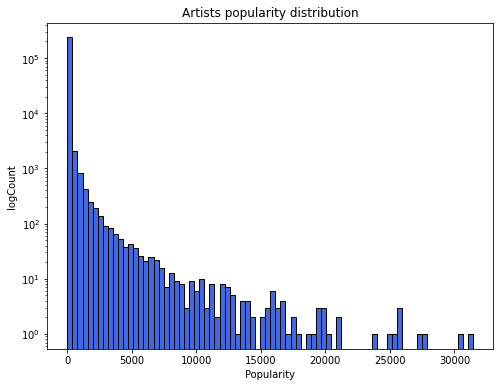

In [15]:
_pvalues = list(popularity.values())

# plot histogram
fig, ax = plt.subplots(figsize=(8,6))

plt.title('Artists popularity distribution')
ax.hist(_pvalues, bins=80, color='royalblue', log=True, edgecolor = "black")
ax.set_xlabel("Popularity")
ax.set_ylabel("logCount")
plt.show()

In [16]:
print("The artist's mean value of occurances: ", np.mean(_pvalues))

The artist's mean value of occurances:  48.472700369300405


For a better visualization we choose to plot the *Counts* on a logaritmical scale. The distribution is tail-heavy, there are a lot of artists that don't appear very frequently in the dataset. To counteract this skewness, we have opted to remove artists that appear in the dataset 50 times or less, since the mean value of occurances of an artist is 48.47. A threshold based on the average popularity of the artists reduces the influence of less popular artists on the overall distribution, and focus on the more popular ones. 

In [17]:
artists_set = set([key for key, val in popularity.items() if val > 50])
# drop rows with artists which are not in `artists_set`
spotify_df = spotify_df[list(map(lambda artistname: set(artistname).issubset(artists_set), spotify_df.artistname))]

A new column, `tracks`, is created to associate the `artistname` with `trackname`, as some tracks can have the same name but be performed by different artists. The new column allows us to compute the frequency of these tracks, which will be an essential step in creating the *users network* (we will explain why later in this notebook).

In [18]:
# we want `artistname` to be hashable, hence we use a frozenset
spotify_df.artistname = spotify_df.artistname.apply(frozenset)
# since multiple tracks can have the same name, it is essential to create a new entry
# in `spotify_df`, where we combine the track's name with the performing artist
spotify_df["tracks"] = list(zip(spotify_df['trackname'], spotify_df['artistname']))
# compute the tracks frequency and save it into spotify_df
spotify_df["tracks_freq"] = spotify_df.groupby(['tracks'])['tracks'].transform('count')

# 2. Building the networks

## 2.1 Building the artists network

For the artists network we will use as nodes the artists which can be found in the `spotify_df` after data preprocessing. Between two nodes an edge will be created only if the collaboration of the two artists can be found in the dataset. Since this network is based on artist's collaboration, we will call it *the artist's collaboration network*.

In [19]:
import networkx as nx
# build th artist network
artists_graph = nx.Graph()
# use the artists as nodes
artists_graph.add_nodes_from(artists_set)

We extract collaborations from the `spotify_df`, where there is a collaboration only if multiple artist list entries are associated with each track.

In [20]:
collaborations = spotify_df.loc[map(lambda artists: len(artists) > 1, spotify_df.artistname)][["artistname"]]
print("Number of collaborations in dataset:", len(collaborations))

Number of collaborations in dataset: 245934


We connect each artist according to their collaborations.

In [21]:
artists_edges = list(map(lambda a: [(a[i], a[j]) for i in range(0, len(a) - 1) for j in range(i + 1, len(a))],\
                        collaborations.artistname.apply(list)))
artists_edges = [j for i in artists_edges for j in i]

In [22]:
artists_graph.add_edges_from(artists_edges)

### 2.1.1 Artists' collaboration network

The next step is to remove the isolated nodes (the artists without collaborations) and extracted the largest connected component.

In [23]:
artists_graph.remove_nodes_from(list(nx.isolates(artists_graph)))
Gcc = sorted(nx.connected_components(artists_graph), key=len, reverse=True)
artists_graph = artists_graph.subgraph(Gcc[0])

print("Number of nodes:", artists_graph.number_of_nodes())
print("Number of edges:", artists_graph.number_of_edges())

Number of nodes: 4580
Number of edges: 9830


Once we have the largest component connected, we can remove the entries in the `spotify_df` corresponding to artists that are not a node, which will reduce the dataset size even more.

In [38]:
# update the artists_set
artists_set = set(artists_graph.nodes())
# drop rows with artists which are not a node
spotify_df = spotify_df[list(map(lambda artistname: set(artistname).issubset(artists_set), spotify_df.artistname))]

# if save == True:
#     spotify_df.to_pickle(r'/content/drive/MyDrive/SocialGraphs/spotify_dataset_preprocessed.pickle')

#### Get information from Spotify API

To complete our analysis, we must obtain data regarding the genres of the artists, which can be gathered by using **Spotify's API**. Additionally, we will get the related-artists from **Spotify** to construct a second artists network to assess whether the sample upon which the artists' collaboration network was constructed is reflective of the real-world distribution, and consequently if the collaboration network is reflective too.

The artists' information will be stored in a new dataset, `artists_df`

In [ ]:
artists_set = set(artists_graph.nodes())
data = {'artistname': list(artists_set),
        'id': [None] * len(artists_set),
        'popularity': [None] * len(artists_set),
        'genres': [None] * len(artists_set),
        'related_artists': [None] * len(artists_set)}
artists_df = pd.DataFrame(data)

# if save == True:
#     artists_df.to_pickle(r'/content/drive/MyDrive/SocialGraphs/artists_dataset.pickle')

In [ ]:
# load credentials
credentials = json.load(open('authorization.json'))
client_id = credentials['client_id']
client_secret = credentials['client_secret']

In [ ]:
def search_artist_spotify(artist):
    results = sp.search(q=artist.artistname, type='artist')
    match = []

    for result in results['artists']['items']:
        # check if artist was found
        if result['name'].lower() == artist.artistname:
            match.append(result)
        # if multiple matches has been found, keep the most popular one
        if len(match) >= 1:
            match = sorted(match, key = lambda i: i["popularity"], reverse=True)

            artist.id = match[0]["id"]
            artist.popularity = match[0]["popularity"]
            artist.genres = match[0]["genres"]
    
    return artist

In [ ]:
def get_related_artists_spotify(artist):
    results = sp.artist_related_artists(artist.id)
    related_artists=list()
    for result in results['artists']:
        if result['name'].lower() in set(artists_df.artistname):
            related_artists.append(result['name'].lower())
    artist.related_artists = related_artists

In [ ]:
sp = spotipy.Spotify(client_credentials_manager=SpotifyClientCredentials(
    client_id=client_id,
    client_secret=client_secret,
    ))

i = 0
for _, artist in artists_df.iterrows():
    if i % 100 == 0:
        clear_output()
        print(i, "/", len(artists_df))
    i += 1
    artist = search_artist_spotify(artist)

4500 / 4580


In [ ]:
sp = spotipy.Spotify(client_credentials_manager=SpotifyClientCredentials(
    client_id=client_id,
    client_secret=client_secret,
    ), requests_timeout=10, retries=10)

i = 0
for _, artist in artists_df.iterrows():
    if i % 100 == 0:
        clear_output()
        print(i, "/", len(artists_df))
    i += 1
    if artist.id != None:
        get_related_artists_spotify(artist)

4500 / 4580


In [ ]:
artists_df.head()

,artistname,id,popularity,genres,related_artists
0,z-trip,0YUefH6Li1IsJBtlUWgtwc,33,[turntablism],"[cut chemist, lyrics born, x-ecutioners, black..."
1,canton jones,3nzEXHMRFWTw4zt3pVRv6V,36,"[christian hip hop, gospel]","[james fortune, kierra sheard, fred hammond]"
2,drums,None,None,None,None
3,meshell ndegeocello,0uZRjholJ0fVC2J9EvnYnj,46,[neo soul],"[les nubians, raphael saadiq, jill scott, leel..."
4,birdy,2WX2uTcsvV5OnS0inACecP,70,[pop],"[gabrielle aplin, emeli sandé, ella eyre]"


We need to check how many artists have not been returned by Spotify API, and remove them from `artists_graph`, `artists_df` and `spotify_df`.

In [ ]:
no_info = (list(artists_df[artists_df.id.isnull()].artistname) + list(artists_df[artists_df.genres.isnull()].artistname))
print("Number of artists which haven't been returned by Spotify API:", len(no_info))

Number of artists which haven't been returned by Spotify API: 398


In [ ]:
# update the artists_set
artists_set = set(artists_graph.nodes())
# remove unreturned artists from spotify_df
spotify_df = spotify_df[list(map(lambda artistname: set(artistname).issubset(artists_set), spotify_df.artistname))]

# remove unreturned artists from artists_df
artists_df = artists_df[~(artists_df.id.isnull()) & ~(artists_df.genres.isnull())]
# uncomment if you want to save the dataframe
# artists_df.to_pickle(r'/content/drive/MyDrive/SocialGraphs/artists_dataset.pickle')

# remove unreturned artists form artists graph
artists_graph = nx.Graph(artists_graph) # unfreeze the graph
artists_graph.remove_nodes_from(list(no_info))
Gcc = sorted(nx.connected_components(artists_graph), key=len, reverse=True)
artists_graph = artists_graph.subgraph(Gcc[0])

print("number of nodes:", artists_graph.number_of_nodes())
print("number of edges:", artists_graph.number_of_edges())

number of nodes: 4238
number of edges: 9067


The final artists' collaboration graphs generated based on the `#nowplaying` dataset has the 4238 nodes and 9067 edges.

We should append information about the genres to each track from `spotify_df`

In [ ]:
def get_genre(artists):
    genres = []
    for artist in artists:
        genres += artists_df.loc[artist].genres
    return genres

artists_df.set_index("artistname", inplace=True)
spotify_df["genre"] = list(map(get_genre, spotify_df.artistname))
artists_df.reset_index(inplace=True)

In [ ]:
spotify_df.columns

Index(['user_id', 'artistname', 'trackname', 'genre', 'tracks', 'tracks_freq'], dtype='object')

The final `spotify dataframe` has 6 columns: `user_id`, `artistname`, `trackname`, `genre`, `tracks` and `tracks_freq`.

In [ ]:
# uncomment if you want to save the dataframe
# spotify_df.to_pickle(r'/content/drive/MyDrive/SocialGraphs/spotify_dataset_processed.pickle')
spotify_df = pd.read_pickle(r'/content/drive/MyDrive/SocialGraphs/spotify_dataset_processed.pickle')

### 2.1.2 Spotify related artists' network

In [ ]:
# construct artist network
sp_artists_graph = nx.Graph()
sp_artists_graph.add_nodes_from(artists_set)

In [ ]:
sp_artists_edges = list(map(lambda a, ras: [(a, ra) for ra in ras],
                            artists_df[~artists_df.related_artists.isnull()].artistname,
                            artists_df[~artists_df.related_artists.isnull()].related_artists))
sp_artists_edges = [j for i in sp_artists_edges for j in i]

In [ ]:
sp_artists_graph.add_edges_from(sp_artists_edges)
sp_artists_graph.remove_nodes_from(list(nx.isolates(sp_artists_graph)))
Gcc = sorted(nx.connected_components(sp_artists_graph), key=len, reverse=True)
sp_artists_graph = sp_artists_graph.subgraph(Gcc[0])

print("number of nodes:", sp_artists_graph.number_of_nodes())
print("number of edges:", sp_artists_graph.number_of_edges())

number of nodes: 3778
number of edges: 19524


Comparing the two networks, the network created based on Spotify's related artists has a lower number of nodes which is accepted since the API's query didn't return all the artists. We have two hypotheses about this behaviour. Firstly, we occurred a limitation due to the API's functionality (the artist name hasn't been returned due to timeout). Secondly, the artists' name from `spotify_df` still might be faulty due the human error.

On the other hand, the number of edges is higher for this network, the reason might be that Spotify uses more heuristics than collaborations to consider two artists related. The lacking of relevant collaborations from the `spotify_df` cannot be excluded.

In [ ]:
# save network as edge list
from networkx.readwrite import json_graph
with open("/content/drive/MyDrive/SocialGraphs/artists_graph.json", "w") as outfile:
    outfile.write(json.dumps(json_graph.node_link_data(artists_graph)))
with open("/content/drive/MyDrive/SocialGraphs/sp_artists_graph.json", "w") as outfile:
    outfile.write(json.dumps(json_graph.node_link_data(sp_artists_graph)))

## 2.2 Building the users network

In [40]:
spotify_df = pd.read_pickle(r'/content/drive/MyDrive/SocialGraphs/spotify_dataset_preprocessed.pickle')

In [59]:
print("Number of unique users:", spotify_df.user_id.nunique())

Number of unique users: 15267


The `sporify_df` contains 15267 unique users, resulting in a very dense network since we expect the users' network to be quite dense. To reduce the users' number, we will analyze their number of tracks distribution.

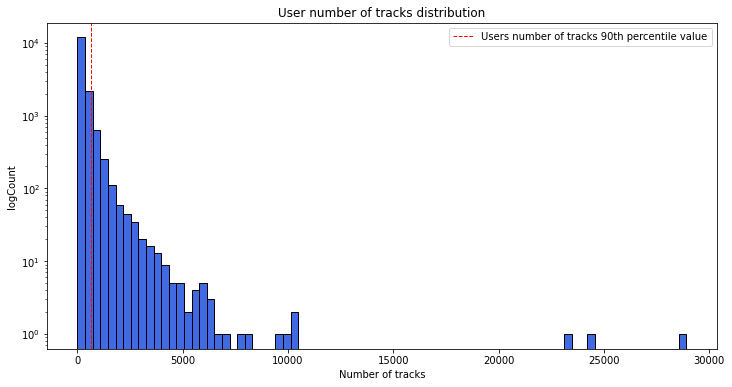

In [60]:
_tracksno = spotify_df.groupby(['user_id'])['tracks'].agg('count')
_tracksno90h = np.percentile(_tracksno, 90)


# plot histogram
fig, ax = plt.subplots(figsize=(12,6))

plt.title('User number of tracks distribution')
ax.hist(_tracksno, bins=80, color='royalblue', log=True, edgecolor = "black")
# draw 90th percentile value for the tracks popularity distribution:
plt.axvline(_tracksno90h, color='r', linestyle='dashed', linewidth=1, label='Users number of tracks 90th percentile value')
ax.set_xlabel("Number of tracks")
ax.set_ylabel("logCount")
plt.legend()
plt.show()

In [61]:
print("Users number of tracks 90th percentile value is", _tracksno90h)

Users number of tracks 90th percentile value is 626.0


We expect a very dense network. So, to reduce the computational power and ease the analysis and also keep the relevant information about the users' sample, we eliminate the users which are listening to more than 600 tracks (since the 90th percentile around 630, we keep around 90% of the information). The assumption on which we based is that if a user is listening to various large number of tracks, they are unable to provide meaningful contribution to the community they are part of.

In [62]:
# count each users tracks
spotify_df['tracksno'] = spotify_df.groupby(['user_id'])['tracks'].transform('count')

spotify_df = spotify_df[(spotify_df.tracksno < 600)] 
print("Number of users after prefiltering:", len(set(spotify_df.user_id)))

Number of users after prefiltering: 13641


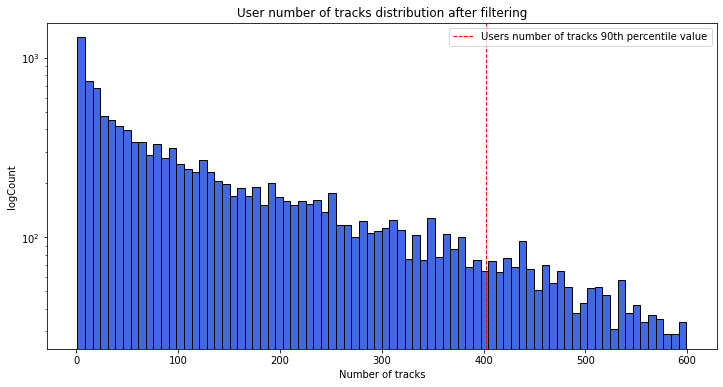

In [65]:
_tracksno = spotify_df.groupby(['user_id'])['tracks'].agg('count')
_tracksno90h = np.percentile(_tracksno, 90)

# plot histogram
fig, ax = plt.subplots(figsize=(12,6))

plt.title('User number of tracks distribution after filtering')
ax.hist(_tracksno, bins=80, color='royalblue', log=True, edgecolor = "black")
# draw 90th percentile value for the tracks popularity distribution:
plt.axvline(_tracksno90h, color='r', linestyle='dashed', linewidth=1, label='Users number of tracks 90th percentile value')
ax.set_xlabel("Number of tracks")
ax.set_ylabel("logCount")
plt.legend()
plt.show()

After users filtering, we also reduce the skewness of the data.

In order to create the users' network, we need to discover the connections between the users. Hence, we construct a `users_df`, where the users who are listening to the same song are grouped in a list.

In [ ]:
# users dataframe
users_df = spotify_df.groupby(['tracks', 'freq'])['user_id'].apply(list).reset_index()

Once the users are grouped, we can create a data frame with edges. Given the list of users, `[A, B, C]`,  where users are listening to a particular song which has the frequency `f`, we create a link between each of the three users weighted with `f`, `A-B`, `A-C` and `B-C`. The final `users_df` will have three columns **source**, **target** and **weight**, and will be use to generate the users' network. 

In [ ]:
users_edges = list(map(lambda users, freq: [(users[i], users[j], freq) for i in range(0, len(users) - 1) for j in range(i + 1, len(users))],\
                       users_df.user_id, users_df.freq))
users_edges = [j for i in users_edges for j in i]

users_df = pd.DataFrame( \
           users_edges,\
           columns =['source', 'target', 'weight'])

# if two users have multiple tracks in common, aggregate the weight of each track
users_df = users_df.groupby(['source', 'target'])['weight'].agg(np.sum).reset_index()
users_df.head()

,source,target,weight
0,00055176fea33f6e027cd3302289378b,000c11a16c89aa4b14b328080f5954ee,0.006690
1,00055176fea33f6e027cd3302289378b,00b4539e695290d981811f448e6df4ea,0.030556
2,00055176fea33f6e027cd3302289378b,00b79debf87ef0364017de90836dc35e,0.003717
3,00055176fea33f6e027cd3302289378b,00c58a505e97067cf582e2cfac4e3a04,0.004254
4,00055176fea33f6e027cd3302289378b,00d00aec0d2d486af2d8dd4816574066,0.005405


In [ ]:
del users_edges
gc.collect()

In [ ]:
# build the users graph from users_df
users_graph = nx.from_pandas_edgelist(
    users_df,
    edge_attr=["weight"],
    create_using=nx.Graph(),
)

# delete users_df to free memory since all needed information is in `users_graph`
del users_df
gc.collect()

In [ ]:
print("number of nodes:",len(users_graph.nodes()))
print("number of edges:", len(users_graph.edges()))
print(f"graph density: {round(nx.density(users_graph)*100,2)}%")

Even if we reduced the number of nodes by filtering the users that are listening vast amount of tracks (a number higher than the number of songs that are listening by 90% of users), the network is still very dense to be analyzed by a regular computer. To solve this drawback, we have to extract the backbone - the sub-graph that captures the most important connections and relationship within our users nertwork. 

To extract the backbone we use the `disparity filter` approch, which have been discuss in [Extracting the multiscale backbone of complex weighted networks](https://https://www.pnas.org/doi/epdf/10.1073/pnas.0808904106). The disparity filter is a way to identify which connections in a network should be preserved. It removes the weakest ones based on a user-defined threshold value. The process is iteratively and continues until only the strongest connesctions remain - the backbone ot the network.

The implementation of the disparity filter, which can be found in the `disparity_filter.py` script, was borrowed from [aekpalakorn/python-backbone-network](https://github.com/aekpalakorn/python-backbone-network).

In [ ]:
from disparity_filter import disparity_filter

alpha = 0.05 
users_graph = disparity_filter(users_graph)
users_graph = nx.Graph([(u, v, d) for u, v, d in users_graph.edges(data=True) if d['alpha'] < alpha])

print('backbone: nodes = %s, edges = %s' % (users_graph.number_of_nodes(), users_graph.number_of_edges()))
print(users_graph.edges(data=True))

In [66]:
# uncomment to save network as edge list
# from networkx.readwrite import json_graph
# with open("/content/drive/MyDrive/SocialGraphs/Spotify_data/users_graph_backbone.json", "w") as outfile:
#     outfile.write(json.dumps(json_graph.node_link_data(users_graph)))

from networkx.readwrite import json_graph
with open("/content/drive/MyDrive/SocialGraphs/Spotify_data/users_graph_backbone.json", "r") as f:
    js_graph = json.load(f)
users_graph = json_graph.node_link_graph(js_graph)

In [67]:
print("number of nodes:",len(users_graph.nodes()))
print("number of edges:", len(users_graph.edges()))
print(f"graph gensity: {round(nx.density(users_graph)*100,2)}%")

number of nodes: 13130
number of edges: 1791938
graph gensity: 2.08%


Our final users network consists of 13,130 nodes and 1,791,938 edges, where the graph density has been reduced to 2.08%, making the graph easier to analyze.

# 3. Collaboration artist's network analysis

In [5]:
from networkx.readwrite import json_graph
with open("/content/drive/MyDrive/SocialGraphs/Spotify_data/artists_graph.json", "r") as f:
    js_graph = json.load(f)
artists_graph = json_graph.node_link_graph(js_graph)

As mentioned earlier, each node represents a Spotify artist from the #nowplaying dataset. If there is a collaboration between two artists, we include an edge between the two nodes representing the artists.

Hence, the degree of the nodes represents the number of collaborations an artist has with other artists.

## 3.1 Density of the graph

The density of a graph represents the ratio between the edges present in the graph and the maximum number of edges that a graph can contain. Conceptually, this gives us an idea of how dense our artist graph is in terms of edge connectivity.

In [3]:
print("Artists graph density:", nx.density(artists_graph))

Artists graph density: 0.0010098902865083358


We observe that the density of the graph is very low, which tells us that the artists graph is not very dense ie. artists don't really collaborate as much as they could. This makes sense as an artist is likely to be selective with picking their collaborators as not all genres are able to mesh well with each other. The selective and intentional nature of collaboration would hence lead to a low artist network graph density.

## 3.2 Degree Distribution

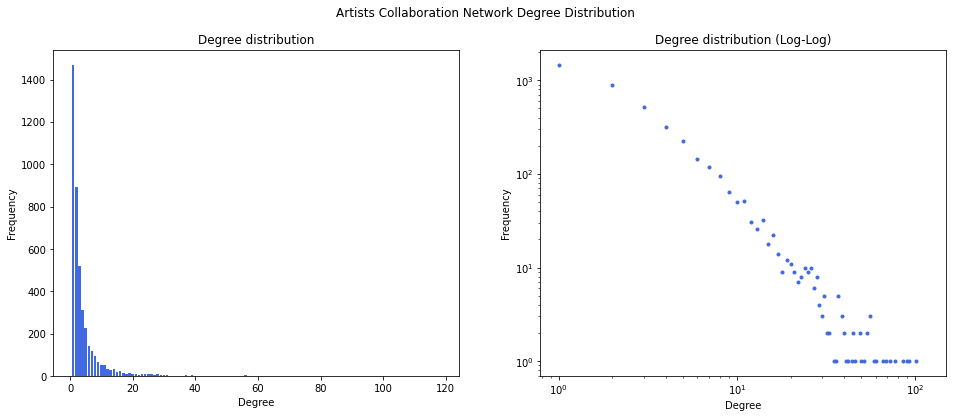

In [8]:
# Plot degree distribution
artists_graph_degree = list(dict(artists_graph.degree()).values())
hist, bins = np.histogram(artists_graph_degree, bins=range(min(artists_graph_degree), max(artists_graph_degree)))

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Artists Collaboration Network Degree Distribution")
ax[0].bar(bins[:-1], hist, color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Frequency")
ax[0].set_title("Degree distribution")

ax[1].loglog(bins[:-1], hist,'.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("Frequency")
ax[1].set_title("Degree distribution (Log-Log)")


plt.show()
     

Here, we observe that most of the nodes have low degrees, some of them have a moderate degree, and a few nodes that have very high degrees. This means that most of the artists have few collaborations, while some artists have a higher number of collaborations, and a few artists have many collaborations (hubs).

We also investigate the mean, median, mode, maximum and minimum degrees.

In [5]:
# churn out a pandas dataframe that gives us information on the various summary statistics of degrees in the network
graph_degree_statistics = pd.DataFrame([[np.mean(artists_graph_degree), np.median(artists_graph_degree),
                                         stats.mode(artists_graph_degree)[0][0],
                                         max(artists_graph_degree), min(artists_graph_degree)]],
                                       columns='Mean Degree,Median Degree,Mode Degree,Maximum Degree,Minimum Degree'.split(','))
graph_degree_statistics

,Mean Degree,Median Degree,Mode Degree,Maximum Degree,Minimum Degree
0,4.278905,2.0,1,120,1


In [6]:
# find which artist has the highest degree ie. most number of collaborations
sorted(artists_graph.degree, key=lambda x: x[1], reverse=True)[0]

('his orchestra', 120)

We observe that the mean degree is around 4.27, which indicates that on average, each artist has about 4 collaborations. This might not be the best metric to look at as we have outliers (hubs that have a very high degree/no. of collaborations).

We also analyze the median degree, which tells us that at the 50th percentile, artists have about 2 collaborations.The most prominent number of collaborations is 1, meaning that most artists have one collaboration only.We can also see that there is one artist with 120 collaborations. Out of curiosity, we take a look at who this artist is. Looks like 'His Orchestra' is the artist with the most number of collaborations.

Finally, we see that the minimum number of collaborations is 1, which is expected as we removed all the isolated nodes in our pre-processing ie. the artists with no collaborations.

We are essentially checking if the artist network is a scale-free network.

A scale-free network is a network whose degree distribution follows a power law. This means that the logarithm of the probability of a node having a certain degree k depends linearly on the logarithm of degree k, and the slope of a line representing the relationship is the power law coefficient γ.

When the power law coefficient γ is high, the number of nodes with high degree is snaller than the number of nodes with low degree. A high value of γ represents a network in which the distribution of edges is fairer.

In [7]:
gamma = powerlaw.Fit(artists_graph_degree).alpha
print("Degree exponent:", round(gamma, 3))

Calculating best minimal value for power law fit
Degree exponent: 3.598


We observe that the artist network's degree distribution does indeed obey a power law. In other words, the artist network is a scale-free network.

The power law coefficient we obtained from our analysis is about 3.598. Hence, the artist network follows the small world regime since degree exponent γ is greater than 3.

This means that the second moment of the degree, variance, is finite. Inherently, this tells us that the spread in terms of collaborations between artists is quantifiable and does not diverge. The average distance between the artists also follows the small world result that's derived for random networks.

For scale-free networks where γ > 3, hubs continue to be present (as seen from some artists that have many collaborations). However, they are not sufficiently large and numerous to have a significant impact on the distance between the nodes. This means that the distances between each artist in the network is larger compared to a network with a smaller degree exponent γ.

## 3.3 Artists' network communities

We aim to identify the optimal partition that separates the network into communities to analyze how artists form clusters and the characteristics of the communities they belong to.

In [16]:
from community import community_louvain
# compute the best partition
communities = community_louvain.best_partition(artists_graph, random_state=0) 
# we used random_state parameter so that the results can be reproduced
mod = community_louvain.modularity(communities, artists_graph)
print("modularity is", mod)

modularity is 0.7246005737783654


We obtained a high modularity score of 0.724 for the best partition.

Modularity measures the strength of division of a network into communities, where a higher modularity implies better partition. Since we are computing the modularity score of the best partition, we are obtaining the maximum modularity.

Networks with high modularity have dense connections between the nodes within communities but sparse connections between nodes in different communities. As such, we can conclude that the artist network is well-separated into various distinct communities where each community is made up of different artists that have collaborated extensively with other artists in that community.

We plot a barplot that shows us the number of artists in each community.


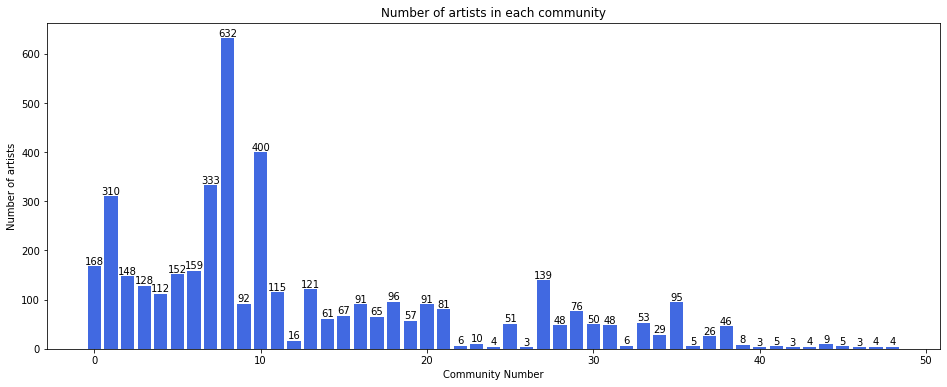

In [19]:
# get the count of artists in each community
count_artists_community = list(Counter(communities.values()).values())
# get the community number
community_no = list(Counter(communities.values()).keys())

fig, ax = plt.subplots(figsize=(16,6))
p = ax.bar(community_no, count_artists_community, color='royalblue')

ax.axhline(0, color='grey', linewidth=0.8)
ax.set_ylabel('Number of artists')
ax.set_xlabel('Community Number')
ax.set_title('Number of artists in each community')
ax.bar_label(p)

plt.show()
     


####Plot the network using ForceAtlas2
* We color the different communities differently to show the modularity of the network.
* We also display each node differently depending on the degree of each node.



100%|██████████| 2000/2000 [03:35<00:00,  9.28it/s]


BarnesHut Approximation  took  94.56  seconds
Repulsion forces  took  109.70  seconds
Gravitational forces  took  0.14  seconds
Attraction forces  took  0.62  seconds
AdjustSpeedAndApplyForces step  took  2.77  seconds


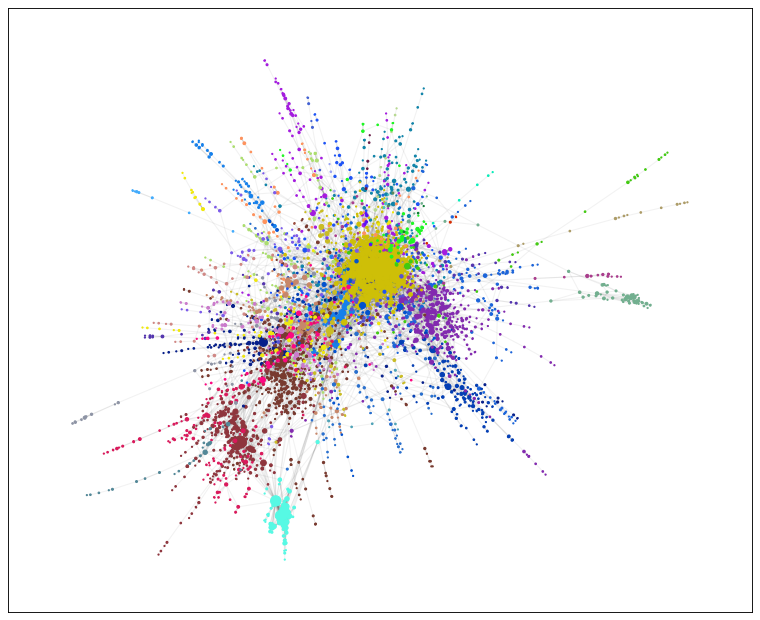

In [11]:
forceatlas2 = fa2.ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        edgeWeightInfluence=0,

                        # Performance
                        jitterTolerance=0.9,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,

                        # Tuning
                        scalingRatio=0.1,
                        strongGravityMode=True,
                        gravity=0.6,

                        # Log
                        verbose=True)
positions = forceatlas2.forceatlas2_networkx_layout(artists_graph, pos=None, iterations=2000)
        
plt.figure(figsize=(12, 10), dpi=80)
communities_color = {} # keep a dict with colors for each community
nodelist_dc = []

for community in  Counter(communities.values()):
    communities_color[community] = np.array([random.uniform(0, 1), random.uniform(0, 1), random.uniform(0, 1)])
    nodelist = []
    
    for node in artists_graph:
        if node not in communities:
            nodelist_dc.append(node)
        elif communities[node] == community:
            nodelist.append(node)
    # display nodes from current artist community      
    nx.draw_networkx_nodes(artists_graph,
                           pos=positions,
                           nodelist=nodelist,
                           node_size=list(dict(artists_graph.degree(nodelist)).values()),
                           node_color=communities_color[community].reshape(1,-1), label=community)
nx.draw_networkx_edges(artists_graph, pos=positions, alpha=0.05)

We are intersted to visualized the most popular artists in the artists comunity, for which we will use a wordcloud representation, since we want compare them with the most popular artists from users communities. 

In [43]:
%%time
# communities sorted by size
comm_size = dict(sorted(Counter(communities.values()).items(), key=lambda item: item[1], reverse=True)).keys()
# split nodes in communities
comm_split = defaultdict(list)
for key, val in sorted(communities.items()):
    comm_split[val].append(key)
comm_split = dict(sorted(comm_split.items()))

index_map = {v: i for i, v in enumerate(comm_size)}
comm_split = dict(sorted(comm_split.items(), key=lambda pair: index_map[pair[0]]))

CPU times: user 10.8 ms, sys: 14 µs, total: 10.8 ms
Wall time: 20.3 ms


In [15]:
# Plot
def plot_word_cloud(document, title):
    wc = WordCloud(
            background_color="white", 
            max_words=4000, contour_width=3, 
            contour_color='steelblue', 
            collocations=False
        ).generate(document)

    plt.figure(figsize=[8,4])
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

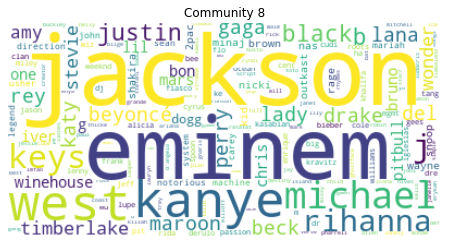

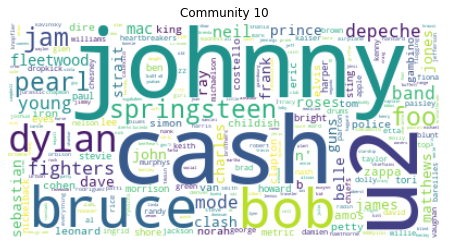

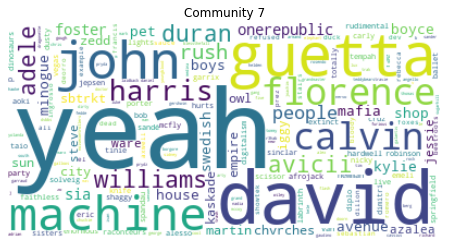

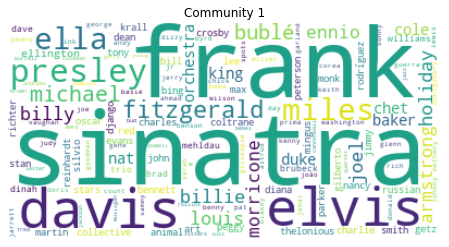

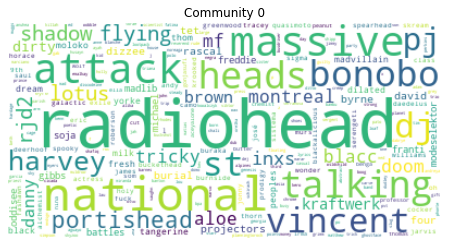

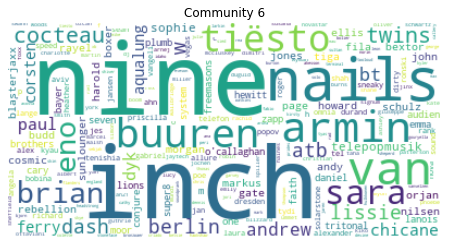

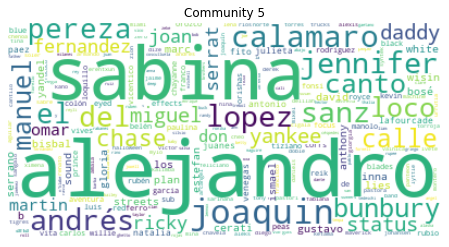

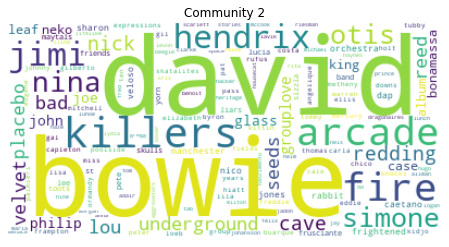

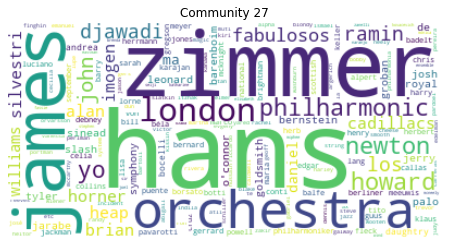

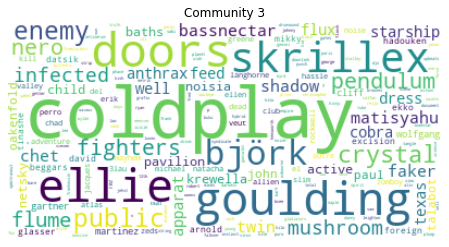

In [45]:
# compute number of occurancies
popularity = Counter([x for xs in spotify_df.artistname for x in set(xs)])

cnt = 0
for (key, comm_doc) in comm_split.items():
    if cnt == 10:
        break
    doc_words = " ".join([(a + " ") * int(popularity[a]) for a in comm_doc])
    plot_word_cloud(doc_words, "Community " + str(key))
    cnt+=1

## 3.4 Clustering Coefficient

According to the [NETWORK SCIENCE by ALBERT-LÁSZLÓ BARABÁSI](http://networksciencebook.com/chapter/2#clustering) the clustering coefficient captures the degree to which the neighbors of a given node link to each other.
In our case, a node with a high clustering coefficient suggests that the majority of the collaborators of the given node have also collaborated with one another.

We first plot the distribution of the clustering coefficients across all the artists. Then, we take a look at some of the summary statistics for the clustering coefficients.

In [13]:
# obtain clustering coefficient of all the nodes/artists in the network
clustering_coeff = nx.clustering(artists_graph)

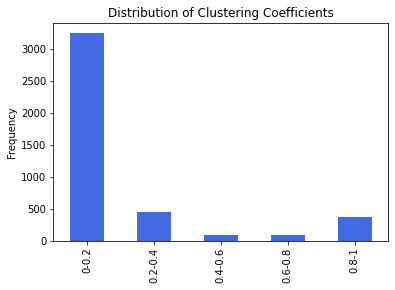

In [16]:
# plot the distribution of the clustering coefficients across all the artists
# first, we have to do binning since clustering coefficients are continuous values
bins = [0, 0.2, 0.4, 0.6, 0.8, 1]
labels = ['0-0.2', '0.2-0.4', '0.4-0.6', '0.6-0.8', '0.8-1']
fig, ax = plt.subplots()

pd.cut(list(clustering_coeff.values()), bins=bins, labels=labels, include_lowest=True).value_counts().plot(kind='bar', color='royalblue')
ax.set_ylabel('Frequency')
ax.set_title('Distribution of Clustering Coefficients')

plt.show()

We observe that majority of the artists have a clustering coefficient within 0 and 0.2. This is undoubtedly a result of most of the artists having a clustering coefficient of 0. This means that the collaborators of these artists are not linked to each other at all.

On the contrary, we can see that there is a sizeable chunk of artists with clustering coefficient ranging from 0.8 - 1. This means that these artists are collaborating with other artists that are also likely collaborating with each other.

In [17]:
# churn out a pandas dataframe that gives us information on the various summary statistics of clustering coefficients in the network
clustering_coeff_values = list(clustering_coeff.values())
graph_clustering_coeff_statistics = pd.DataFrame([[np.mean(clustering_coeff_values), np.median(clustering_coeff_values), 
                                                  stats.mode(clustering_coeff_values)[0][0], max(clustering_coeff_values), min(clustering_coeff_values)]],
                                                  columns='Mean Clustering Coefficient,Median Clustering Coefficient,Mode Clustering Coefficient,Maximum Clustering Coefficient,Minimum Clustering Coefficient'.split(','))
graph_clustering_coeff_statistics   


,Mean Clustering Coefficient,Median Clustering Coefficient,Mode Clustering Coefficient,Maximum Clustering Coefficient,Minimum Clustering Coefficient
0,0.165733,0.0,0.0,1.0,0


From this set of summary statistics, we can see that the average clustering coefficient is only 0.17.

This means that on average, artists within the network tend to collaborate with artists that do not collaborate with each other. This finding measures up with the hypothesis that artists tend to be selective about their collaborations, choosing not to collaborate with many artists even if they have had mutual collaborations.

###3.4.1 Computing clustering coefficient within communities

In [42]:
# create a dataframe that stores clustering coefficient of an artist and community they belong to
cc_community_df = pd.DataFrame(index=communities.keys(), columns=['Clustering Coefficient', 'Community'])
for i in cc_community_df.index:
  cc_community_df.loc[i, :] = [clustering_coeff[i], communities[i]]



# get the top 5 communities by average clustering coefficient
top_5_communities_cc = cc_community_df.groupby('Community').mean().sort_values(by='Clustering Coefficient', ascending=False)[:5]

To visualize our findings better, we plot the boxplot that details the summary statistics of the clustering coefficient for each of the top 5 communities via average clustering coefficient.

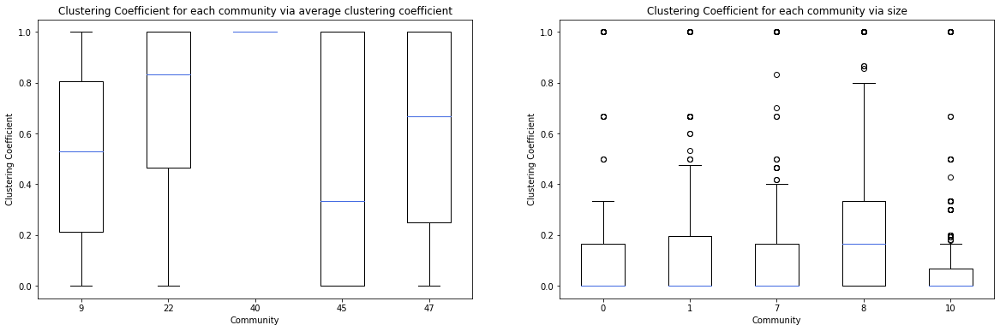

In [44]:
# split nodes in communities
community_split_cc = defaultdict(list)
for key, val in sorted(communities.items()):
    # get top 5 communities via average clustering coefficient
    if val in top_5_communities_cc.index:
      community_split_cc[val].append(key)

# dictionary of community : list of artists in that community for the top 5
# communities via average clustering coefficient
community_split_cc = dict(sorted(community_split_cc.items()))
# clustering coefficient for each community:
clustering_coeff_comm = {}
for key, values in community_split_cc.items():
    clustering_coeff_comm[key] = list(nx.clustering(artists_graph.subgraph(values)).values())
clustering_coeff_comm = dict(sorted(clustering_coeff_comm.items()))


fig, ax = plt.subplots(1,2, figsize=(20,6))
ax[0].boxplot(clustering_coeff_comm.values(),
           medianprops=dict(color='royalblue'))

ax[0].set_xticklabels(clustering_coeff_comm.keys())
ax[0].set_ylabel('Clustering Coefficient')
ax[0].set_xlabel('Community')
ax[0].set_title('Clustering Coefficient for each community via average clustering coefficient')


# get the top 5 communities by size
top_5_communities_size = cc_community_df.groupby('Community').count().sort_values(by='Clustering Coefficient', ascending=False)[:5]
top_5_communities_size

# split nodes in communities
community_split_size = defaultdict(list)
for key, val in sorted(communities.items()):
    # get top 5 communities via size
    if val in top_5_communities_size.index:
      community_split_size[val].append(key)
# dictionary of community : list of artists in that community for top 5 communities
# via size
community_split_size = dict(sorted(community_split_size.items()))
# clustering coefficient for each community:
clustering_coeff_comm = {}
for key, values in community_split_size.items():
    clustering_coeff_comm[key] = list(nx.clustering(artists_graph.subgraph(values)).values())
clustering_coeff_comm = dict(sorted(clustering_coeff_comm.items()))
ax[1].boxplot(clustering_coeff_comm.values(),
           medianprops=dict(color='royalblue'))
ax[1].set_xticklabels(clustering_coeff_comm.keys())
ax[1].set_ylabel('Clustering Coefficient')
ax[1].set_xlabel('Community')
ax[1].set_title('Clustering Coefficient for each community via size')

plt.show()

When we compare the top 5 communities via average clustering coefficient and the top 5 communities via size, we observe that in general, the top 5 communities via clustering coefficient has higher median clustering coefficient than the top 5 communities via size.

Unsurprisingly, this means that there are more collaborations within communities of artists where the artists' collaborators end up collaborating with each other, as compared to communities that have larger sizes.

### 3.4.2 Correlation between clustering coefficient and degree

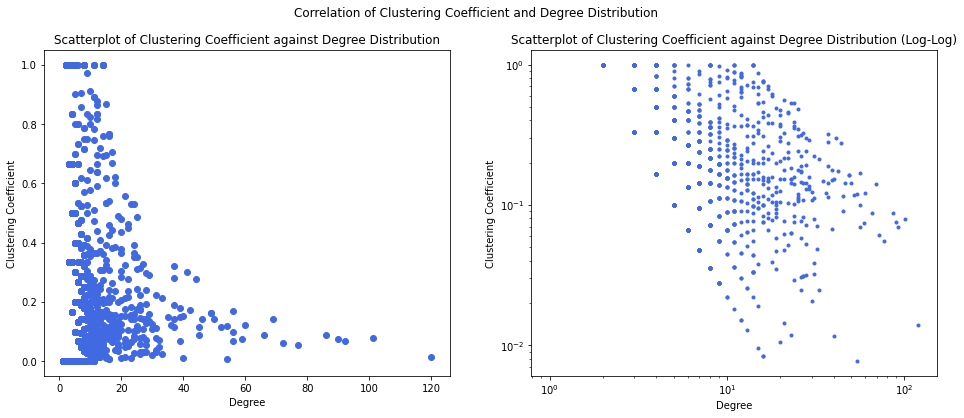

In [26]:
# Plot clustering coefficient vs degree distribution

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Clustering Coefficient and Degree Distribution")
ax[0].scatter(artists_graph_degree, clustering_coeff_values, color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Clustering Coefficient")
ax[0].set_title("Scatterplot of Clustering Coefficient against Degree Distribution")

ax[1].loglog(artists_graph_degree, clustering_coeff_values,'.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("Clustering Coefficient")
ax[1].set_title("Scatterplot of Clustering Coefficient against Degree Distribution (Log-Log)")

plt.show() 


We observe that if a node has a higher degree, its neighbors become more sparsely connected with each other. This means the artists that have a lot of collaborations are collaborating with artists that do not collaborate amongst each other. This is unsurprising as hubs (artists with lots of collaborations) may be linked to mostly nodes with low degree (artists with a few collaborations).


## 3.5 Centrality measures: Betweenness Centrality
We opt to use betweenness centrality as it determines the importance of artists based on the number of times they occur within the shortest paths between other nodes.

In [27]:
# get betweenness centrality of each artist
betweenness_centrality = nx.betweenness_centrality(artists_graph)
# sort the betweenness centrality
betweenness_centrality = dict(sorted(betweenness_centrality.items()))

In [28]:
# average betweenness centrality for the entire artist network
np.mean(list(betweenness_centrality.values()))

0.0012194396814830329

We see that the average betweenness centrality for the entire artist network is only 0.00128. This means that most of the artists are not in the shortest paths between artists. This is expected given the large size of the scale-free network.

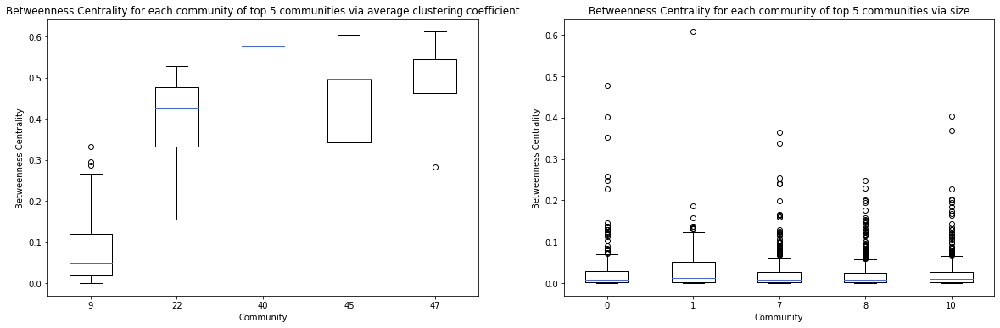

In [31]:
# betweenness centrality for each community of the top 5 via average clustering coefficient
betweenness_centrality_comm = {}
for key, values in community_split_cc.items():
    betweenness_centrality_comm[key] = list(nx.eigenvector_centrality(artists_graph.subgraph(values), max_iter=1000).values())
betweenness_centrality_comm = dict(sorted(betweenness_centrality_comm.items()))
fig, ax = plt.subplots(1,2, figsize=(20,6))

ax[0].boxplot(betweenness_centrality_comm.values(), medianprops=dict(color='royalblue'))
ax[0].set_xticklabels(betweenness_centrality_comm.keys())
ax[0].set_ylabel('Betweenness Centrality')
ax[0].set_xlabel('Community')
ax[0].set_title('Betweenness Centrality for each community of top 5 communities via average clustering coefficient')



# betweenness centrality for each community of the top 5 via size
betweenness_centrality_comm = {}
for key, values in community_split_size.items():
    betweenness_centrality_comm[key] = list(nx.eigenvector_centrality(artists_graph.subgraph(values), max_iter=1000).values())
betweenness_centrality_comm = dict(sorted(betweenness_centrality_comm.items()))

ax[1].boxplot(betweenness_centrality_comm.values(), medianprops=dict(color='royalblue'))
ax[1].set_xticklabels(betweenness_centrality_comm.keys())
ax[1].set_ylabel('Betweenness Centrality')
ax[1].set_xlabel('Community')
ax[1].set_title('Betweenness Centrality for each community of top 5 communities via size')
plt.show()

We observe that the betweenness centrality for top 5 communities via average clustering coefficient are generally significantly higher than the average betweenness centrality for the entire artist network.

For the top 5 communities via size, the betweenness centralities for each one of the communities are closer to the global betweenness centrality.

### 3.5.1 Correlation between centrality and degree distribution

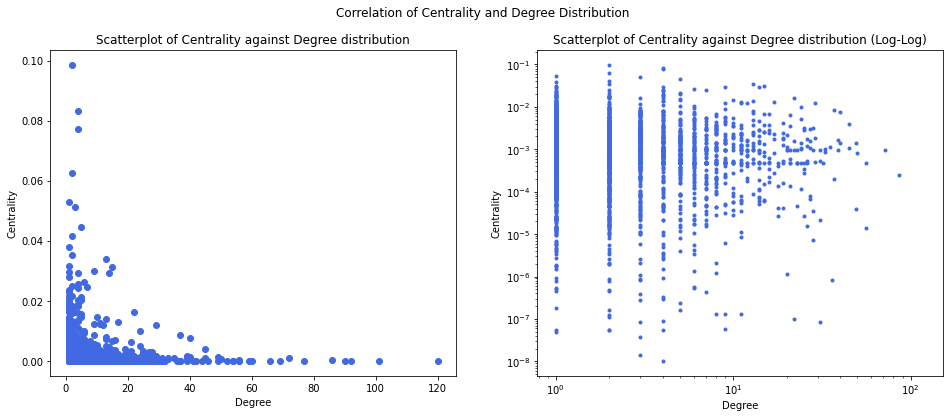

In [38]:
# Plot centrality and degree distribution

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Centrality and Degree Distribution")
ax[0].scatter(artists_graph_degree, betweenness_centrality.values(), color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Centrality")
ax[0].set_title("Scatterplot of Centrality against Degree distribution")

ax[1].loglog(artists_graph_degree, list(betweenness_centrality.values()), '.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("Centrality")
ax[1].set_title("Scatterplot of Centrality against Degree distribution (Log-Log)")

plt.show()

In [34]:
print("Correlation of Centrality and Degree Distribution:", round(np.corrcoef(artists_graph_degree, list(betweenness_centrality.values()))[0,1],2))

Correlation of Centrality and Degree Distribution: -0.01


It seems that the centrality is not correlated with the degree distribution.

###3.5.2 Correlation between centrality and artists popularity

In [12]:
# compute number of occurancies
popularity = Counter([x for xs in spotify_df.artistname for x in set(xs)])

In [11]:
_popvalues = []
for a in betweenness_centrality.keys():
    _popvalues.append(popularity[a])

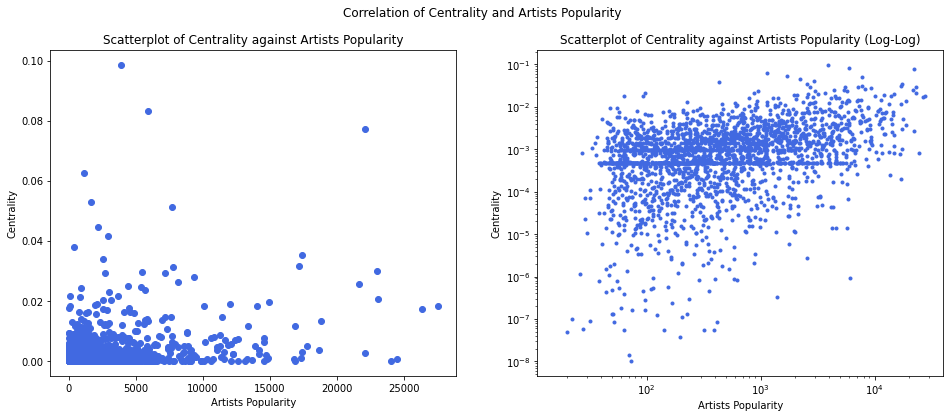

In [40]:
# Plot centrality and artists popularity
fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Centrality and Artists Popularity")
ax[0].scatter(_popvalues, betweenness_centrality.values(), color='royalblue')
ax[0].set_xlabel("Artists Popularity")
ax[0].set_ylabel("Centrality")
ax[0].set_title("Scatterplot of Centrality against Artists Popularity")

ax[1].loglog(_popvalues, list(betweenness_centrality.values()), '.', color='royalblue')
ax[1].set_xlabel('Artists Popularity')
ax[1].set_ylabel("Centrality")
ax[1].set_title("Scatterplot of Centrality against Artists Popularity (Log-Log)")

plt.show()

In [41]:
print("Correlation of Centrality and Artist's popularity:", round(np.corrcoef(_popvalues, list(betweenness_centrality.values()))[0,1],2))

Correlation of Centrality and Artist's popularity: 0.36


It seems that the popularity of an artist is slightly correlated with the betweens centrality.

### 3.5.3 The most central artists

In [50]:
# print most central nodes
betweenness_centrality_s =  sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)
print("Top 3 most central artists:")
for a, b in betweenness_centrality_s[:3]:
    print(a, b)

Top 3 most central artists:
his orchestra 0.09862290656785967
ray charles 0.08334651657653602
kanye west 0.07733163602104487


Upon human research we came to the conclusion that **His Orchestra** it is one of the outliers. Based on google search and browsing the Spotify catologue it is most likely the **His Orchestra** refers to a specific artists orchestra and not a stand alone artist. 

A notable mention is that Spotify considers **His Orchestra** as an artist but on a closer look all the songs in the playlist are played by an establised artist and **His Orchestra**.

Otherwise both Ray Charles and Kanye West are famous names in the music industry.


## 3.6 Findings

### Popular artists collaborate with popular artists?

We want to check if the people listen to artists that collaborate with other artists more. Artists tend to collaborate with other artists. Not only do they get to try their hand at new genres, but they also massively increase their reach towards new audiences.

To answer this, we check if the artist's popularity (no. of occurrences in the dataset) and the artist's degree of distribution are correlated.


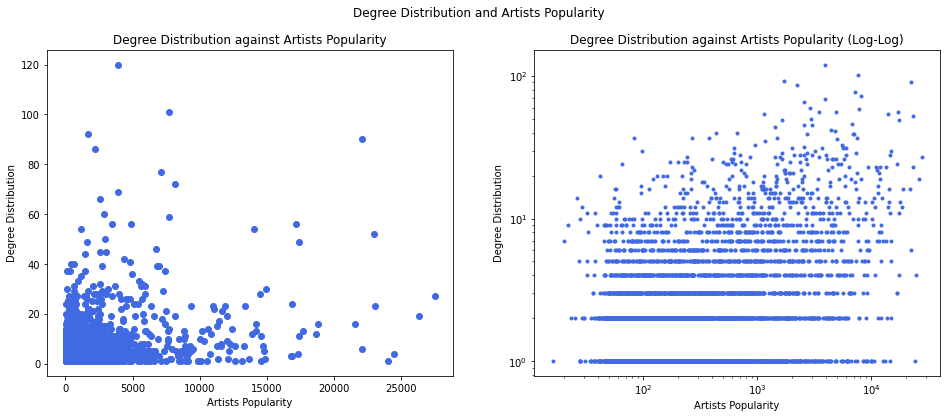

In [13]:
_popvalues = []
for a in dict(artists_graph.degree()).keys():
    _popvalues.append(popularity[a])

# Plot degree distribution and artists popularity
fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Degree Distribution and Artists Popularity")
ax[0].scatter(_popvalues, artists_graph_degree, color='royalblue')
ax[0].set_xlabel("Artists Popularity")
ax[0].set_ylabel("Degree Distribution")
ax[0].set_title("Degree Distribution against Artists Popularity")

ax[1].loglog(_popvalues, artists_graph_degree, '.', color='royalblue')
ax[1].set_xlabel('Artists Popularity')
ax[1].set_ylabel("Degree Distribution")
ax[1].set_title("Degree Distribution against Artists Popularity (Log-Log)")

plt.show()

In [14]:
print("Correlation of Centrality and Artist's popularity:", round(np.corrcoef(_popvalues, artists_graph_degree)[0,1],2))

Correlation of Centrality and Artist's popularity: 0.35


We can clearly see that there is a positive correlation between the artist's degree in the network and their popularity. We cannot definitively determine whether one causes another, but one possible conclusion is that an artist that collaborates with other artists more (and has a higher degree) will have a higher popularity amongst fans as their songs would reach out to wider audiences.

# 4. Spotify artists' network analysis

In [2]:
from networkx.readwrite import json_graph
with open("/content/drive/MyDrive/SocialGraphs/Spotify_data/sp_artists_graph.json", "r") as f:
    js_graph = json.load(f)
graph = json_graph.node_link_graph(js_graph)

In [3]:
print("number of nodes:", graph.number_of_nodes())
print("number of edges:", graph.number_of_edges())

number of nodes: 3778
number of edges: 19524


## 4.1 Density of the graph

In [4]:
print(f'Density: {nx.density(graph)}')

Density: 0.0027364647381626244


The density of the graph is quite low which means that the artists is not well connected to each other.

## 4.2 Degree distribution


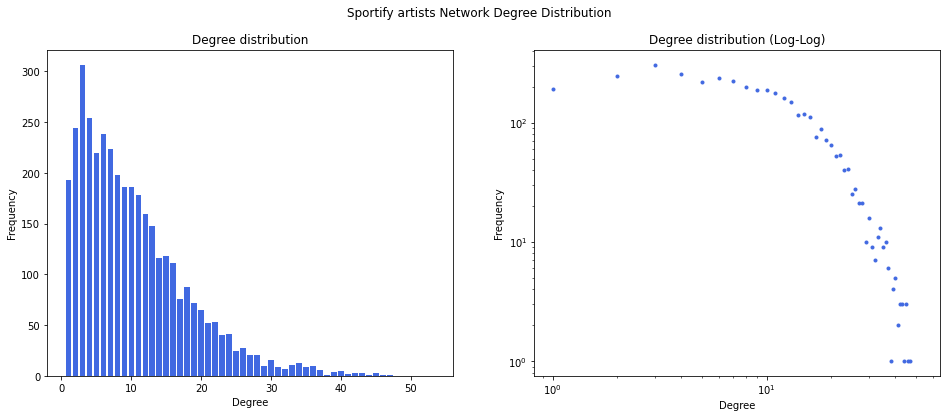

In [5]:
# Plot degree distribution
graph_degree = dict(sorted(dict(graph.degree()).items()))
degree = list(dict(graph.degree()).values())

graph_degree_seq = list(graph_degree.values())
hist, bins = np.histogram(degree, bins=range(min(degree), max(degree))) # return an array with histogram values and the bin edges 

# hist, bins = np.histogram(graph_degree_seq, bins=range(min(graph_degree_seq), max(graph_degree_seq)))


fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Sportify artists Network Degree Distribution")
ax[0].bar(bins[:-1], hist, color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Frequency")
ax[0].set_title("Degree distribution")

ax[1].loglog(bins[:-1], hist,'.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("Frequency")
ax[1].set_title("Degree distribution (Log-Log)")


plt.show()

In [6]:
print('Average:', round(np.mean(graph_degree_seq),3))
print('Median:', np.median(graph_degree_seq))
print('Mode:', statistics.mode(graph_degree_seq))
print('Max:', max(graph_degree_seq))
print('Min:', min(graph_degree_seq))

Average: 10.336
Median: 9.0
Mode: 3
Max: 55
Min: 1


Since the median value is a bit lower compared to the maximum degree of a network and form visual inspection of the logarithmic plot the scatter points do form sort of a straight line. Therefore can we conclude that if follows a power law distribution.

In [9]:
gamma = powerlaw.Fit(graph_degree_seq)
gamma.power_law.alpha

Calculating best minimal value for power law fit


5.622522067730465

Since the degree exponent is higher than 3, we determine it to be a small world.

## 4.3 Artists' network communities

In [10]:
# compute the best partition
communities = community_louvain.best_partition(graph, random_state=0) 
# we used random_state parameter so that the results can be reproduced
mod = community_louvain.modularity(communities, graph)
print("modularity is", mod)

modularity is 0.8490229257181395


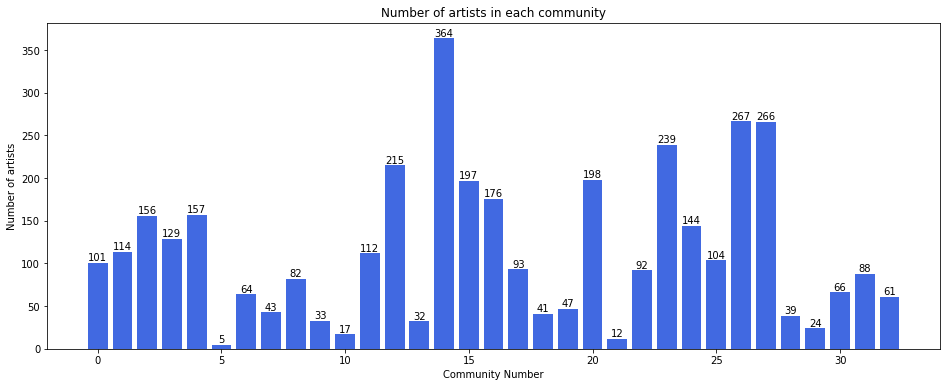

In [13]:
_commnodes = list(Counter(communities.values()).values())
_comm = list(Counter(communities.values()).keys())

fig, ax = plt.subplots(figsize=(16,6))
p = ax.bar(_comm, _commnodes, color='royalblue')

ax.axhline(0, color='grey', linewidth=0.8)
ax.set_ylabel('Number of artists')
ax.set_xlabel('Community Number')
ax.set_title('Number of artists in each community')
ax.bar_label(p)

plt.show()
     

With a modularity of 0.8 shows that it has a strong community structure.

100%|██████████| 2000/2000 [03:22<00:00,  9.88it/s]


BarnesHut Approximation  took  89.15  seconds
Repulsion forces  took  99.89  seconds
Gravitational forces  took  0.20  seconds
Attraction forces  took  1.36  seconds
AdjustSpeedAndApplyForces step  took  3.14  seconds


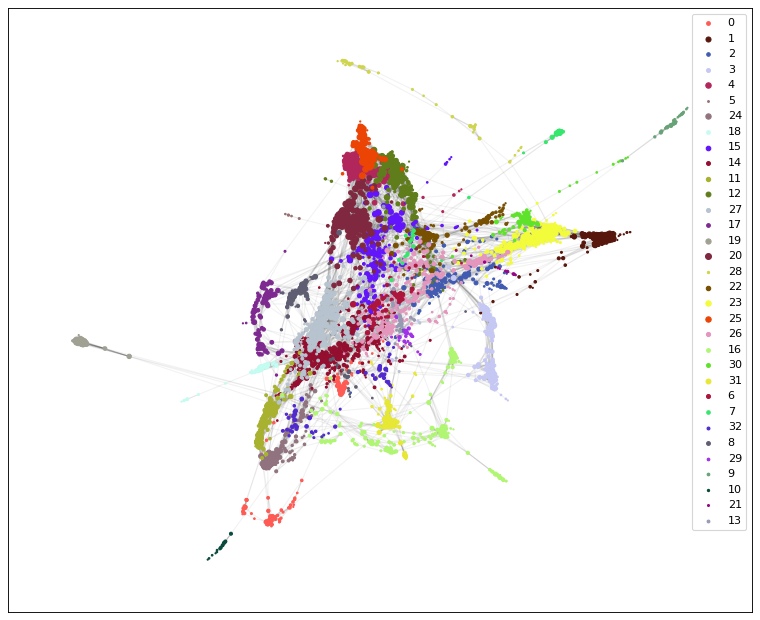

In [14]:
forceatlas2 = fa2.ForceAtlas2(
                        # Behavior alternatives
                        outboundAttractionDistribution=False,  # Dissuade hubs
                        edgeWeightInfluence=0,

                        # Performance
                        jitterTolerance=0.9,  # Tolerance
                        barnesHutOptimize=True,
                        barnesHutTheta=1.2,

                        # Tuning
                        scalingRatio=0.1,
                        strongGravityMode=True,
                        gravity=0.6,

                        # Log
                        verbose=True)
positions = forceatlas2.forceatlas2_networkx_layout(graph, pos=None, iterations=2000)
        
plt.figure(figsize=(12, 10), dpi=80)
communities_color = {} # keep a dict with colors for each community
nodelist_dc = []

for community in  Counter(communities.values()):
    communities_color[community] = np.array([random.uniform(0, 1), random.uniform(0, 1), random.uniform(0, 1)])
    nodelist = []
    
    for node in graph:
        if node not in communities:
            nodelist_dc.append(node)
        elif communities[node] == community:
            nodelist.append(node)
    nx.draw_networkx_nodes(graph,
                           pos=positions,
                           nodelist=nodelist,
                           node_size=list(dict(graph.degree(nodelist)).values()),
                           node_color=communities_color[community].reshape(1,-1), label=community)
nx.draw_networkx_edges(graph, pos=positions, alpha=0.05)
plt.legend()

In [37]:
%%time
# communities sorted by size
comm_size = dict(sorted(Counter(communities.values()).items(), key=lambda item: item[1], reverse=True)).keys()
# split nodes in communities
comm_split = defaultdict(list)
for key, val in sorted(communities.items()):
    comm_split[val].append(key)
comm_split = dict(sorted(comm_split.items()))

index_map = {v: i for i, v in enumerate(comm_size)}
comm_split = dict(sorted(comm_split.items(), key=lambda pair: index_map[pair[0]]))

CPU times: user 7.98 ms, sys: 992 µs, total: 8.97 ms
Wall time: 9.25 ms


In [38]:
# Plot
def plot_word_cloud(document, title):
    wc = WordCloud(
            background_color="white", 
            max_words=4000, contour_width=3, 
            contour_color='steelblue', 
            collocations=False
        ).generate(document)

    plt.figure(figsize=[8,4])
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

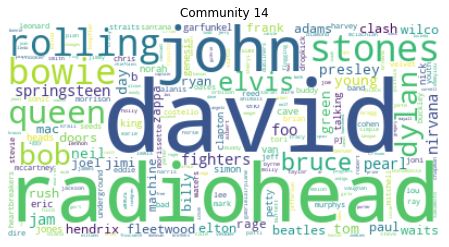

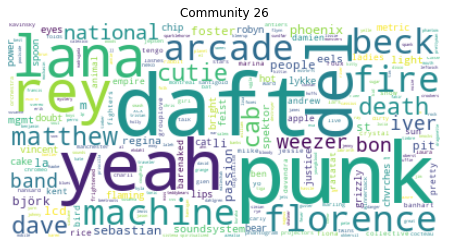

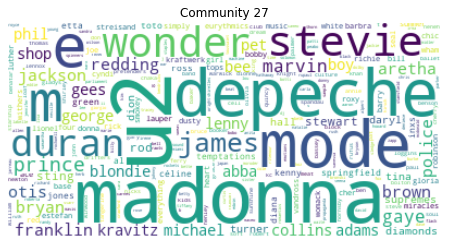

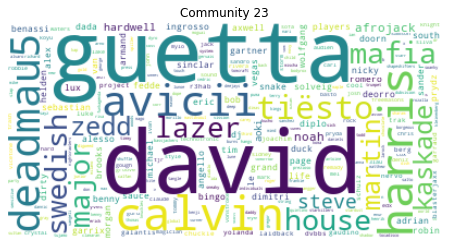

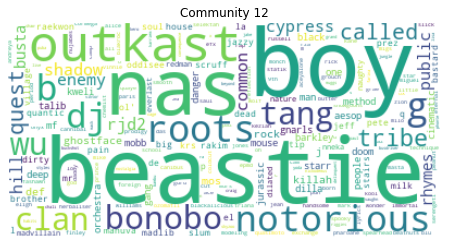

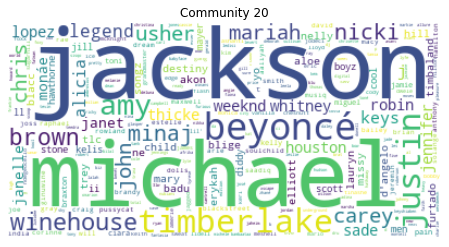

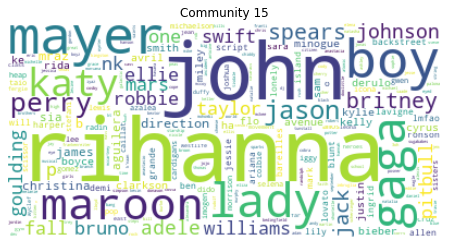

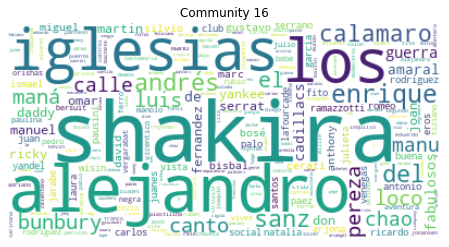

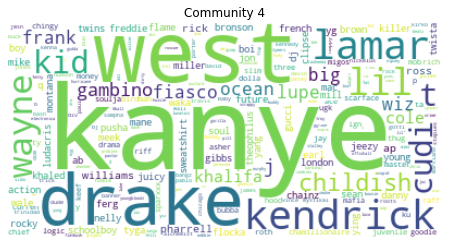

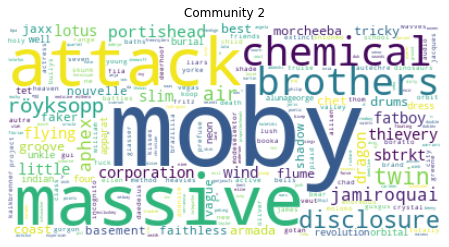

In [41]:
# compute number of occurancies
popularity = Counter([x for xs in spotify_df.artistname for x in set(xs)])

cnt = 0
for (key, comm_doc) in comm_split.items():
    if cnt == 10:
        break
    doc_words = " ".join([(a + " ") * int(popularity[a]) for a in comm_doc])
    plot_word_cloud(doc_words, "Community " + str(key))
    cnt+=1

## 4.4 Clustering Coefficint

In [15]:
cc = nx.clustering(graph)
cc_values = list(cc.values()) 
avg_cc = np.mean(cc_values)
n_cc0 = len(list(filter(lambda n: n == 0, cc_values)))
n_cc1 = len(list(filter(lambda n: n == 1, cc_values)))

print("Average clustering coefficient:", round(avg_cc, 3))
print("Nodes with clustering coefficient 0:", n_cc0)
print("Nodes with clustering coefficient 1:", n_cc1)

Average clustering coefficient: 0.416
Nodes with clustering coefficient 0: 411
Nodes with clustering coefficient 1: 204


Since the clustering is in the middle, we can tell that more of the nodes are closer to 0, than 1. In this way we can conclude that the artists do not necessarily collaborate with others.

In [16]:
# split nodes in communities
comm_split = defaultdict(list)
for key, val in sorted(communities.items()):
    comm_split[val].append(key)
comm_split = dict(sorted(comm_split.items()))

In [17]:
# clustering coefficient for each community:
cc_comm = {}
for key, values in comm_split.items():
    cc_comm[key] = list(nx.clustering(graph.subgraph(values)).values())
cc_comm = dict(sorted(cc_comm.items()))

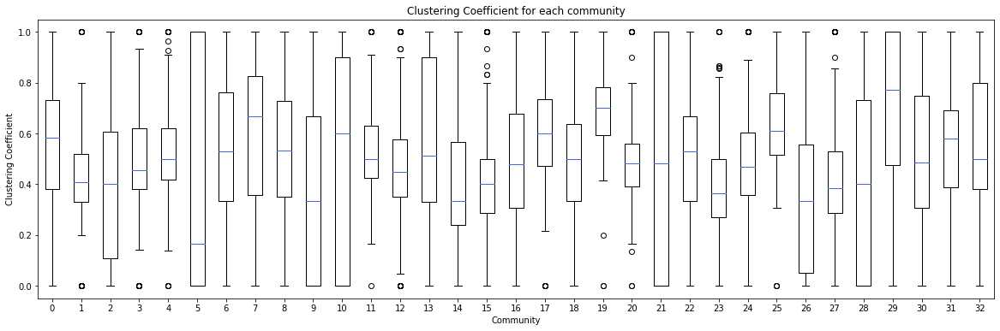

In [19]:
fig, ax = plt.subplots(figsize=(20,6))
ax.boxplot(cc_comm.values(),
           medianprops=dict(color='royalblue'))

ax.set_xticklabels(cc_comm.keys())
ax.set_ylabel('Clustering Coefficient')
ax.set_xlabel('Community')
ax.set_title('Clustering Coefficient for each community')

plt.show()

We can see that the are some communtites which has higher clustering coefficent than the network. This can mean that the communtites with high clustering has more related artists than others.

### 4.4.1 Correlation of Clustering Coefficient vs. Degree

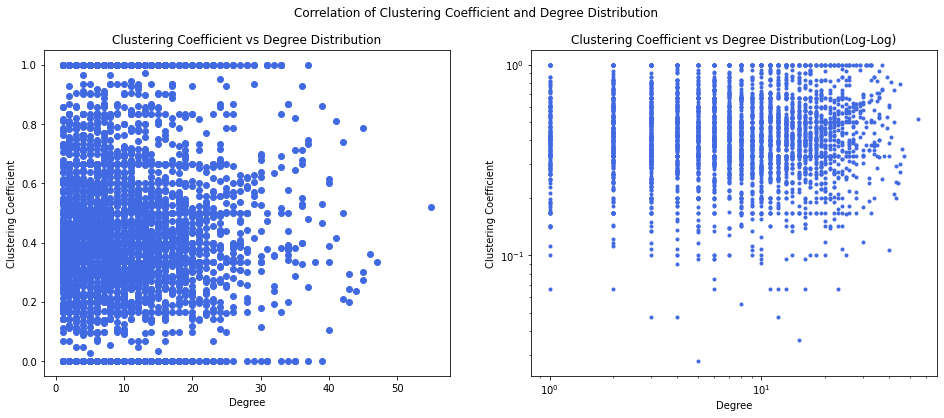

In [20]:
# Plot clustering coefficient vs degree distribution

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Clustering Coefficient and Degree Distribution")
ax[0].scatter(graph_degree_seq, cc_values, color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Clustering Coefficient")
ax[0].set_title("Clustering Coefficient vs Degree Distribution")

ax[1].loglog(graph_degree_seq, cc_values,'.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("Clustering Coefficient")
ax[1].set_title("Clustering Coefficient vs Degree Distribution(Log-Log)")

plt.show()

In [21]:
print("Correlation of Clustering Coefficient and Degree Distribution:", round(np.corrcoef(graph_degree_seq, cc_values)[0,1],2))

Correlation of Clustering Coefficient and Degree Distribution: 0.05


## 4.5 Centrality 

In [22]:
g_betweenness = nx.betweenness_centrality(graph)

In [28]:
sorted_dict = {}
sorted_keys = sorted(g_betweenness, key=g_betweenness.get, reverse=True)[:40] # [1, 3, 2]

for w in sorted_keys:
    sorted_dict[w] = g_betweenness[w]

### 4.5.1 Correlation between Centrality and Degree distribution

philharmonia slavonica


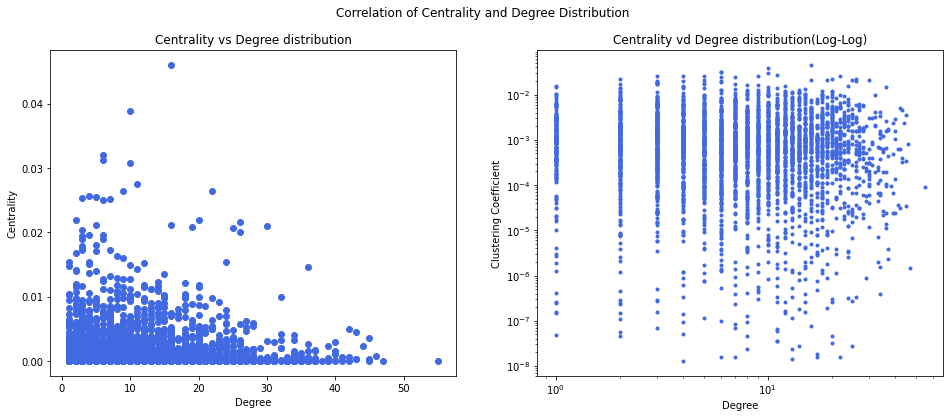

In [33]:
# Plot Centrality and Degree distribution

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Centrality and Degree Distribution")
ax[0].scatter(graph_degree_seq, g_betweenness.values(), color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Centrality")
ax[0].set_title("Centrality vs Degree distribution")

ax[1].loglog(graph_degree_seq, list(g_betweenness.values()),'.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("Clustering Coefficient")
ax[1].set_title("Centrality vd Degree distribution(Log-Log)")

plt.show()

In [36]:
print("Correlation of Centrality and Degree:", round(np.corrcoef(graph_degree_seq, list(g_betweenness.values()))[0,1],2))

Correlation of Centrality and Degree: -0.02


### 4.5.2 Correlation between centrality and artists popularity

In [42]:
# compute number of occurancies
popularity = Counter([x for xs in spotify_df.artistname for x in set(xs)])

In [43]:
_popvalues = []
for a in g_betweenness.keys():
    _popvalues.append(popularity[a])

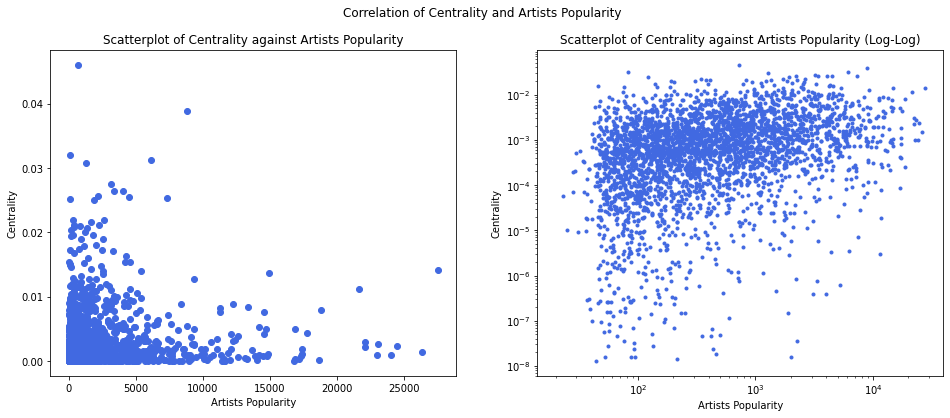

In [44]:
# Plot centrality and artists popularity
fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Centrality and Artists Popularity")
ax[0].scatter(_popvalues, g_betweenness.values(), color='royalblue')
ax[0].set_xlabel("Artists Popularity")
ax[0].set_ylabel("Centrality")
ax[0].set_title("Scatterplot of Centrality against Artists Popularity")

ax[1].loglog(_popvalues, list(g_betweenness.values()), '.', color='royalblue')
ax[1].set_xlabel('Artists Popularity')
ax[1].set_ylabel("Centrality")
ax[1].set_title("Scatterplot of Centrality against Artists Popularity (Log-Log)")

plt.show()

In [46]:
print("Correlation of Centrality and Artist's popularity:", round(np.corrcoef(_popvalues, list(g_betweenness.values()))[0,1],2))

Correlation of Centrality and Artist's popularity: 0.18


### 4.5.3 The most central artists

In [49]:
# print most central nodes
betweenness_centrality_s =  sorted(g_betweenness.items(), key=lambda x: x[1], reverse=True)
print("Top 3 most central artists:")
for a, b in betweenness_centrality_s[:3]:
    print(a, b)

Top 3 most central artists:
cast 0.046061032294654296
amy winehouse 0.03879221885509166
pharrell 0.032041319040572884


# 5. Users' network analysis 

In [68]:
from networkx.readwrite import json_graph
with open("/content/drive/MyDrive/SocialGraphs/Spotify_data/users_graph_backbone.json", "r") as f:
    js_graph = json.load(f)
users_graph = json_graph.node_link_graph(js_graph)

## 5.1 Degree Distribution

We start our discussion about the users network by analyzing the degree distribution, since the degree can quantify the amount of interaction which a user has with other users.

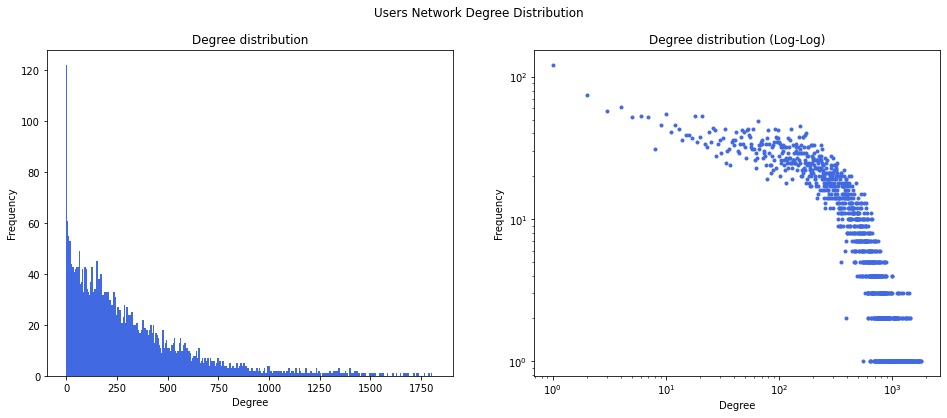

In [69]:
# Plot degree distribution
users_graph_degree = dict(sorted(dict(users_graph.degree()).items()))
users_graph_degree_seq = list(users_graph_degree.values())
hist, bins = np.histogram(users_graph_degree_seq, bins=range(min(users_graph_degree_seq), max(users_graph_degree_seq)))

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Users Network Degree Distribution")
ax[0].bar(bins[:-1], hist, width = 8, color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Frequency")
ax[0].set_title("Degree distribution")

ax[1].loglog(bins[:-1], hist,'.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("Frequency")
ax[1].set_title("Degree distribution (Log-Log)")


plt.show()

In [72]:
print('average:', round(np.mean(users_graph_degree_seq),3))
print('median:', np.median(users_graph_degree_seq))
print('mode:', statistics.mode(users_graph_degree_seq))
print('max:', max(users_graph_degree_seq))
print('min:', min(users_graph_degree_seq))

average: 272.953
median: 207.0
mode: 1
max: 1814
min: 1


A median with a low value compared to the maximum degree of a network and a mode value equal to 1 may indicate a distribution which follows the power law. Moreover, the exponential decay can be seen slightly in the logarithmic plot. Nonetheless, the scatter points do not form a straight line due to a small number of large hubs.

We are interested to see the value for the exponent degree $\gamma$. To get a approximation for $\gamma$, we fit the network degree distribution:

In [ ]:
gamma = powerlaw.Fit(users_graph_degree).alpha
print("Degree exponent:", round(gamma, 3))

Calculating best minimal value for power law fit
Degree exponent: 4.413


In Chapter 4 of [NETWORK SCIENCE by ALBERT-LÁSZLÓ BARABÁSI](http://networksciencebook.com/chapter/4#ultra-small) are defined four region based on the value of the degree exponent.

In our case, the degree exponent $\gamma$ is equal with 4.413 which means that the users network follows the **small world**'s rules. In this regime, the hubs continue to be present, but they are not large or numerous enough to have a significant impact on the distance between nodes.

### Correlation between Degree Distribution and User's Tracks Number

We expect users with a large number of connections to listen to a large number of songs (there is a higher probability for them to have more in common with other users if they are listening to more tracks). To test this hypothesis, we calculate the correlation between the degree and the number of pieces a user has.

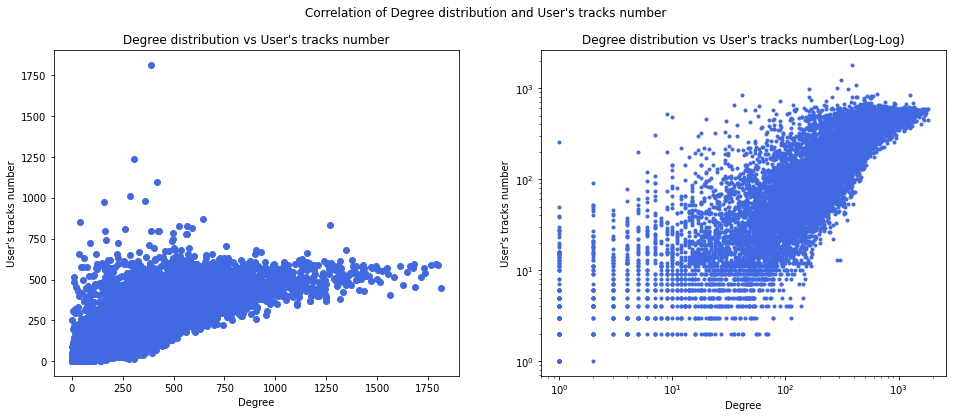

In [ ]:
# Plot degree distribution vs user's tracks number
users_tracks_no = spotify_df[spotify_df.user_id.isin(users_graph_degree.keys())].groupby(['user_id'])['tracks'].agg('count').to_dict()
users_tracks_no = dict(sorted(users_tracks_no.items()))
users_tracks_no_seq = list(users_tracks_no.values())

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Degree distribution and User's tracks number")
ax[0].scatter(users_graph_degree_seq, users_tracks_no_seq, color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("User's tracks number")
ax[0].set_title("Degree distribution vs User's tracks number")

ax[1].loglog(users_graph_degree_seq, users_tracks_no_seq,'.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("User's tracks number")
ax[1].set_title("Degree distribution vs User's tracks number(Log-Log)")

plt.show()

In [ ]:
print("Correlation of Degree distribution and User's tracks number:", round(np.corrcoef(users_graph_degree_seq, users_tracks_no_seq)[0,1],2))

Correlation of Degree distribution and User's tracks number: 0.8


Analyzing the plot, on both scales, linear and logarithmic, we can notice that the number of tracks that a user is listening to is correlated with the user's degree. Moreover, the Pearson product-moment correlation coefficient indicates a strong correlation of 0.8.

## 5.2 Users' network communities

One of our goals is to decide whether the music we listen to places us in a certain category. To conclude this hypothesis, it is essential to analyze the communities formed within the user's network. To compute the users communities we used the [Louvain Community Detection Algorithm](https://python-louvain.readthedocs.io/en/latest/api.html), which compute the partition of the graph nodes which maximises the modularity using the Louvain heuristices.

In [ ]:
%%time
from community import community_louvain
# compute the best partition
communities = community_louvain.best_partition(users_graph, random_state=0) 
# we used random_state parameter so that the results can be reproduced
mod = community_louvain.modularity(communities, users_graph)
print("modularity is", mod)

modularity is 0.31175317923443946
CPU times: user 2min 16s, sys: 564 ms, total: 2min 17s
Wall time: 2min 20s


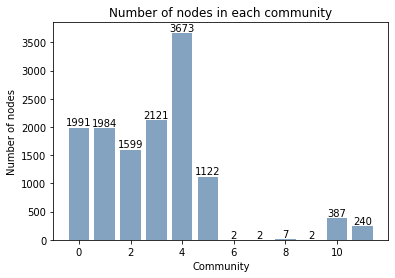

In [ ]:
_commnodes = list(Counter(communities.values()).values())
_comm = list(Counter(communities.values()).keys())
fig, ax = plt.subplots()

p = ax.bar(_comm, _commnodes, color=(0.2, 0.4, 0.6, 0.6))

ax.axhline(0, color='grey', linewidth=0.8)
ax.set_ylabel('Number of nodes')
ax.set_xlabel('Community')
ax.set_title('Number of nodes in each community')
ax.bar_label(p)

plt.show()

The algorithm detects 12 communities, half of which have more than 1000 nodes. Interestingly, four communities have less than ten nodes, which makes these users isolated to some extend from the entire network. However, the modularity is equal to 0.311, indicating good partitioning.

In [ ]:
%%time
# split nodes in communities
comm_split = defaultdict(list)
for key, val in sorted(communities.items()):
    comm_split[val].append(key)
comm_split = dict(sorted(comm_split.items()))

CPU times: user 9.7 ms, sys: 0 ns, total: 9.7 ms
Wall time: 9.61 ms


In [ ]:
with open('/content/drive/MyDrive/SocialGraphs/Spotify_data/user_comm_split.pickle', 'wb') as handle:
    pickle.dump(comm_split, handle, protocol=pickle.HIGHEST_PROTOCOL)

## 5.3 Clustering coefficient

The clustering coefficient is an essential measure for our user network, as we intend to know whether not only the user is connected to another user but also their neighbours. In other words, if a user's neighbours also share the same tracks and music tastes.

The clustering coefficient is a value between 0 and 1, where if the clustering coefficient is 0, none of the neighbors of node link to each other, and if the clustering coefficient is 1, all the neighbors link to each other.

In [ ]:
%%time
cc = nx.clustering(users_graph)
cc_values = list(cc.values()) 

CPU times: user 6min 40s, sys: 929 ms, total: 6min 41s
Wall time: 6min 52s


In [ ]:
avg_cc = np.mean(cc_values)
n_cc0 = len(list(filter(lambda n: n == 0, cc_values)))
n_cc1 = len(list(filter(lambda n: n == 1, cc_values)))

print("Average clustering coefficient:", round(avg_cc, 3))
print("Nodes with clustering coefficient 0:", n_cc0)
print("Nodes with clustering coefficient 1:", n_cc1)

Average clustering coefficient: 0.225
Nodes with clustering coefficient 0: 155
Nodes with clustering coefficient 1: 183


In the users network only 155 nodes have the clustering coeficient equal with 0, which represents 0.011. Similar, the percentage of nodes with a maximum value for clustering coefficint is only 0.014. 

The average clustering coefficient has a relatively low value, only 22.5%. Since the clustering coefficient has been computed at the level of the entire network and we have seen that our networks consist of 12 relatively well-modular partitions, the border nodes which interconnect the communities may diminish the coefficient. In this case is necessary to compute the clustering coefficient for each community.

In [ ]:
# clustering coefficient for each community:
cc_comm = {}
for key, values in comm_split.items():
    cc_comm[key] = list(nx.clustering(users_graph.subgraph(values)).values())
cc_comm = dict(sorted(cc_comm.items()))

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


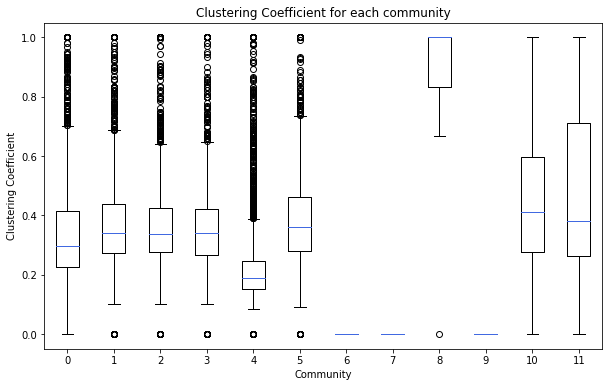

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))
ax.boxplot(cc_comm.values(),
           medianprops=dict(color='royalblue'))

ax.set_xticklabels(cc_comm.keys())
ax.set_ylabel('Clustering Coefficient')
ax.set_xlabel('Community')
ax.set_title('Clustering Coefficient for each community')

plt.show()

It should be noted that for communities 6, 7 and 9 the clustering coefficient is 0 due to the small number of nodes, only two, and should be ignored from this discussion.

In majority of the communities the median of clustring coefficient is higher that 0.3. The median value of the community 4 has a value lower than 0.2, which might indicate a weak linkage between users and therefore, a tendency to listen slightly different kinds of music. 

Visualizing the box-plot of each community, we undertand in the network exist  users with strong linkage, which may indicate that that people who share similar music tastes tend to be friends with each other.



### 5.3.1 Correlation of Clustering Coefficient vs. Degree

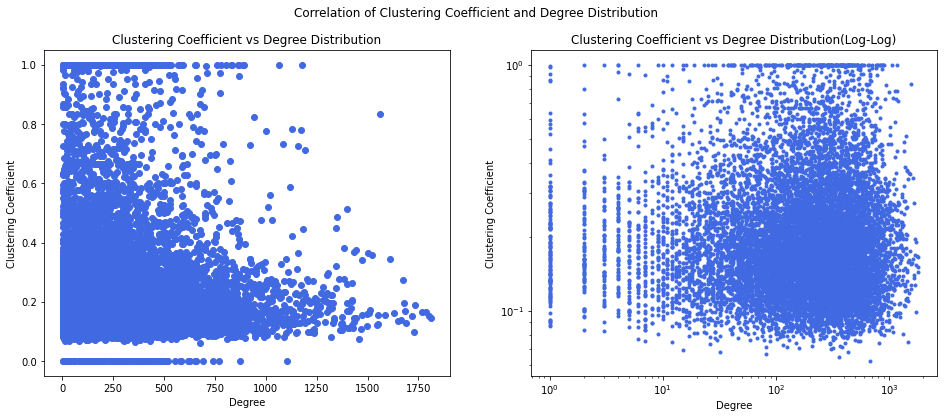

In [ ]:
# Plot clustering coefficient vs degree distribution

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Clustering Coefficient and Degree Distribution")
ax[0].scatter(users_graph_degree_seq, cc_values, color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Clustering Coefficient")
ax[0].set_title("Clustering Coefficient vs Degree Distribution")

ax[1].loglog(users_graph_degree_seq, cc_values,'.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("Clustering Coefficient")
ax[1].set_title("Clustering Coefficient vs Degree Distribution(Log-Log)")

plt.show()

In [ ]:
print("Correlation of Clustering Coefficient and Degree Distribution:", round(np.corrcoef(users_graph_degree_seq, cc_values)[0,1],2))

Correlation of Clustering Coefficient and Degree Distribution: -0.01


Both the two plots and the Pearson coefficient indicate the lack of a correlation between the two variables, which means that a user with a higher degree does not necessarily have a higher clustering coefficient.

## 5.4 Centrality

In [ ]:
%%time
# get degree centrality
ec = nx.eigenvector_centrality(users_graph)
ec = dict(sorted(ec.items()))

CPU times: user 22.2 s, sys: 63.9 ms, total: 22.3 s
Wall time: 25.3 s


### 5.4.1 Correlation of Centrality and Degree Distribution

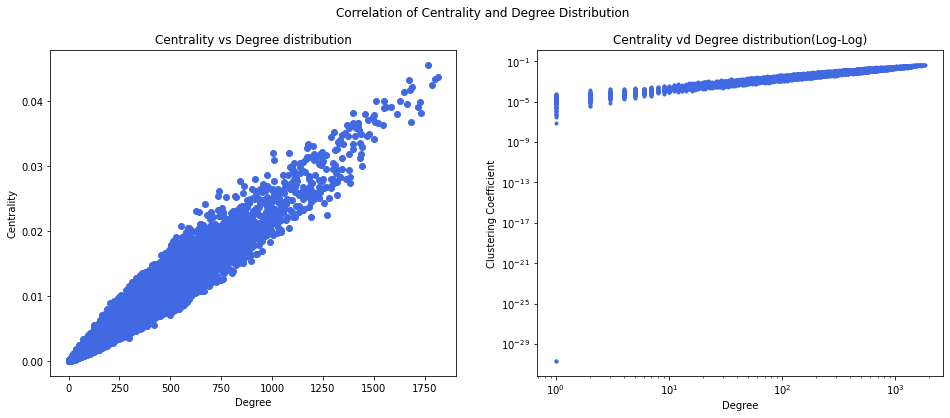

In [ ]:
# Plot Centrality and Degree distribution

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Centrality and Degree Distribution")
ax[0].scatter(users_graph_degree_seq, ec.values(), color='royalblue')
ax[0].set_xlabel("Degree")
ax[0].set_ylabel("Centrality")
ax[0].set_title("Centrality vs Degree distribution")

ax[1].loglog(users_graph_degree_seq, list(ec.values()),'.', color='royalblue')
ax[1].set_xlabel('Degree')
ax[1].set_ylabel("Clustering Coefficient")
ax[1].set_title("Centrality vd Degree distribution(Log-Log)")

plt.show()

In [ ]:
print("Correlation of Centrality and Degree:", round(np.corrcoef(users_graph_degree_seq, list(ec.values()))[0,1],2))

Correlation of Centrality and Degree: 0.97


### 5.4.2 Correlation of Centrality and User's tracks number

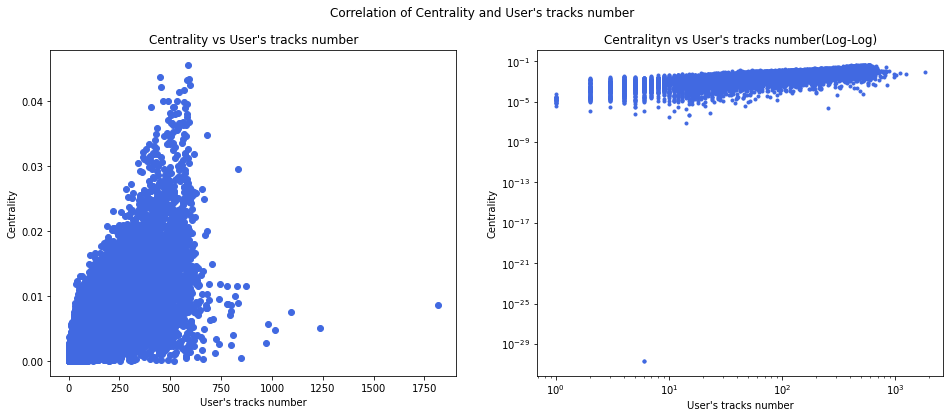

In [ ]:
# Plot Centrality and User's tracks number

fig, ax = plt.subplots(1,2, figsize=(16,6))
fig.suptitle("Correlation of Centrality and User's tracks number")
ax[0].scatter(users_tracks_no_seq, ec.values(), color='royalblue')
ax[0].set_xlabel("User's tracks number")
ax[0].set_ylabel("Centrality")
ax[0].set_title("Centrality vs User's tracks number")

ax[1].loglog(users_tracks_no_seq, list(ec.values()), '.', color='royalblue')
ax[1].set_xlabel("User's tracks number")
ax[1].set_ylabel('Centrality')
ax[1].set_title("Centralityn vs User's tracks number(Log-Log)")

plt.show()

In [ ]:
print("Correlation of Centrality and Number of tracks:", round(np.corrcoef(users_tracks_no_seq, list(ec.values()))[0,1],2))

Correlation of Centrality and Number of tracks: 0.7


Percentage of a user's tracks that are also listened to by other users in the same community

### 5.4.3 Eigenvector centrality for each comunity

In [ ]:
%%time
# eigenvector centrality for each community:
ec_comm = {}
for key, values in comm_split.items():
    ec_comm[key] = list(nx.eigenvector_centrality(users_graph.subgraph(values)).values())
ec_comm = dict(sorted(ec_comm.items()))

CPU times: user 34.8 s, sys: 89.5 ms, total: 34.9 s
Wall time: 35 s


/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


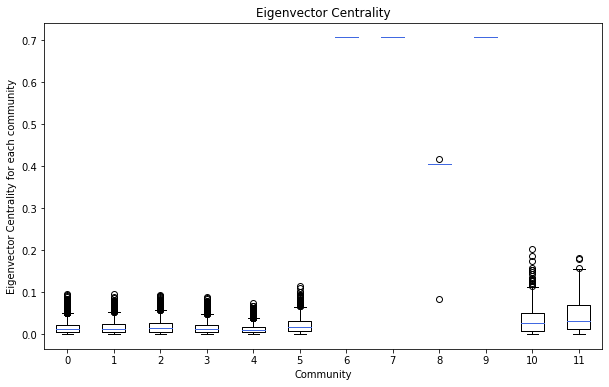

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

ax.boxplot(ec_comm.values(),medianprops=dict(color='royalblue'))
ax.set_xticklabels(ec_comm.keys())
ax.set_ylabel('Eigenvector Centrality for each community')
ax.set_xlabel('Community')
ax.set_title('Eigenvector Centrality')

plt.show()

## 5.5 Findings

### 5.5.1 Percentage of a user's tracks that are also listened to by other users in the same community

We are interseted to discover how many of the user's tracks are listening by other users from the same community.

In [ ]:
%%time
# compute the % of a user's tracks that are also listened to by other users in the same community.
comm_tracks_per = defaultdict(list)
for key, users in comm_split.items():
    tracks = Counter(spotify_df[spotify_df.user_id.isin(users)].tracks)

    i = 0
    for u in users:
        if i % 10 == 0:
            clear_output()
            print(key)
            print(i, "/", len(users))
        i+=1
        
        u_tracks = Counter(spotify_df[spotify_df.user_id == u].tracks)

        diff = tracks - u_tracks
        p = len(set(u_tracks) & set(diff)) / len(set(u_tracks))
        comm_tracks_per[key].append(p)
        
comm_tracks_per = dict(sorted(comm_tracks_per.items()))
# with open('/content/drive/MyDrive/SocialGraphs/Spotify_data/comm_tracks_per.pkl', 'wb') as f:
#     pickle.dump(comm_tracks_per, f)

9
0 / 2
CPU times: user 1h 33min 12s, sys: 25.6 s, total: 1h 33min 37s
Wall time: 1h 34min 37s


/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


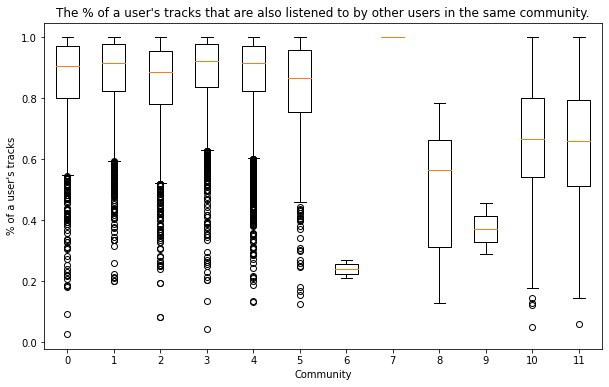

In [ ]:
fig, ax = plt.subplots(figsize=(10,6))

ax.boxplot(comm_tracks_per.values())
ax.set_xticklabels(comm_tracks_per.keys())
ax.set_ylabel("% of a user's tracks")
ax.set_xlabel('Community')
ax.set_title("The % of a user's tracks that are also listened to by other users in the same community.")

plt.show()

The box-plot depicts an expacted behaviour, a trementour percentage of the tracks that a user is listening to are also listened by other users from the same community. 

### 5.5.2 Most popular artist in community

In [ ]:
_comm_artists = defaultdict(list)
for key, users in comm_split.items():
    _comm_artists[key] += [a for artist in spotify_df[spotify_df.user_id.isin(users)].artistname for a in artist]

In [ ]:
TF_gen = {}
for key, value in _comm_artists.items():
    word_list = list(value)
    TF_gen[key] = FreqDist(word_list)

In [ ]:
# Plot
def plot_word_cloud(document, title):
    wc = WordCloud(
            background_color="white", 
            max_words=4000, contour_width=3, 
            contour_color='steelblue', 
            collocations=False
        ).generate(document)

    plt.figure(figsize=[8,4])
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

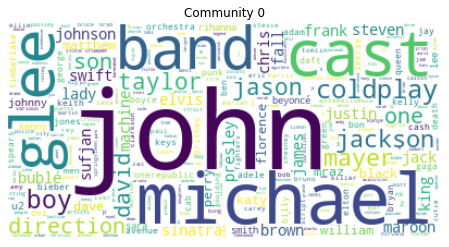

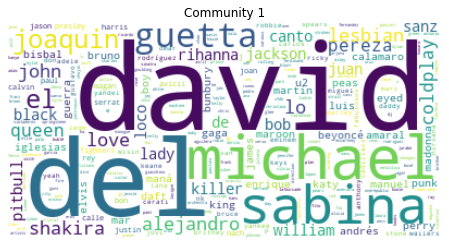

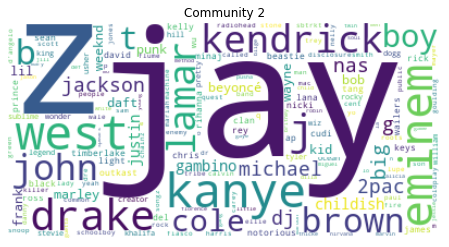

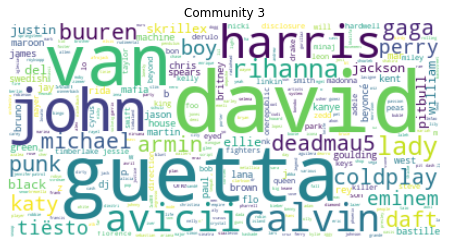

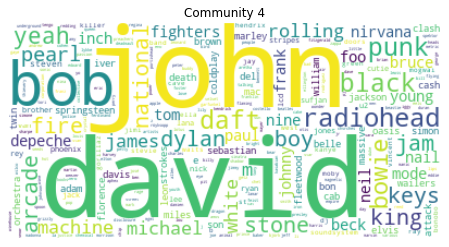

...

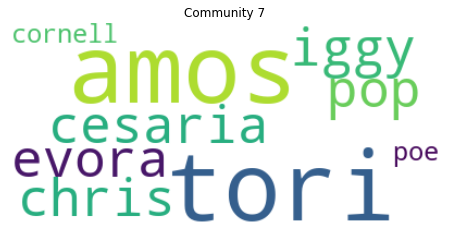

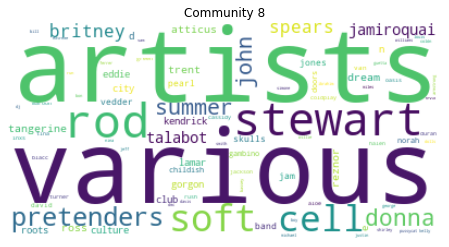

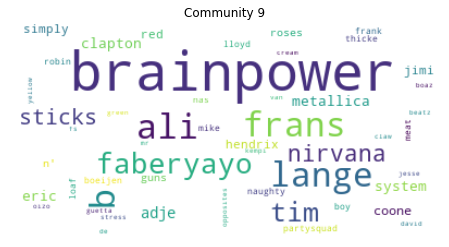

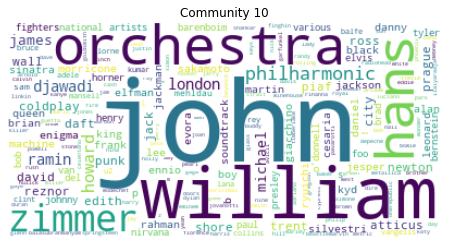

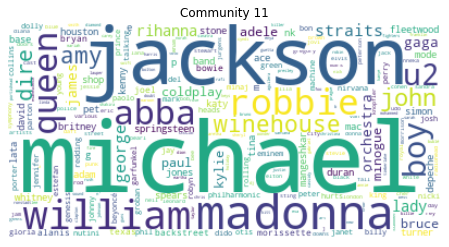

In [ ]:
# Create a WordCloud for each comunity
for (key, tfidf_doc) in TF_gen.items():
    doc_words = " ".join([(w + " ") * int(n) for w, n in Counter(tfidf_doc).most_common()])
    plot_word_cloud(doc_words, "Community " + str(key))

### 5.5.3 Dominant artists

In [ ]:
_comm_genres = defaultdict(list)
for key, users in comm_split.items():
    _comm_genres[key] += [g for genre in spotify_df[spotify_df.user_id.isin(users)].genre for g in genre]

In [ ]:
TF_gen = {}
for key, value in _comm_genres.items():
    word_list = list(value)
    TF_gen[key] = FreqDist(word_list)

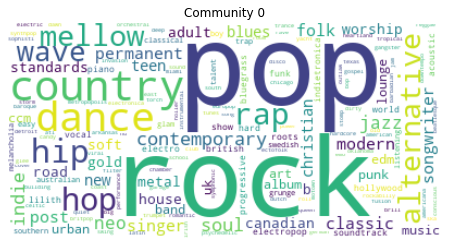

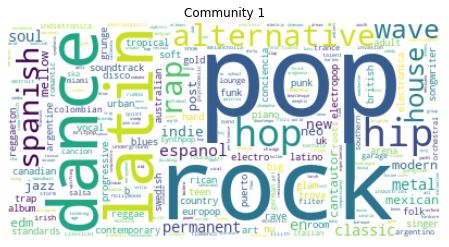

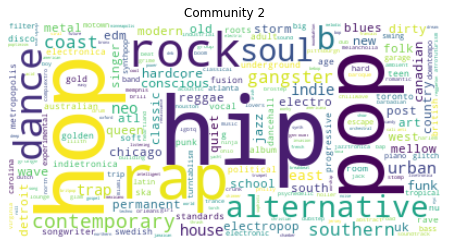

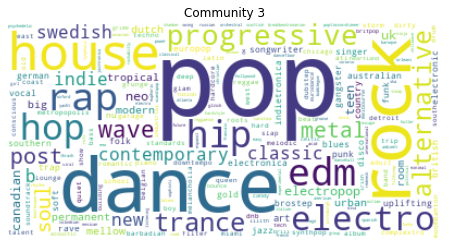

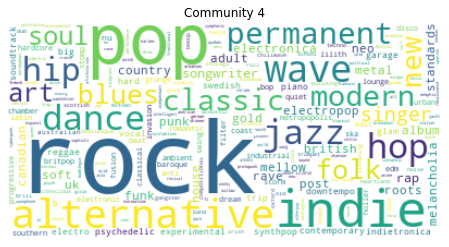

...

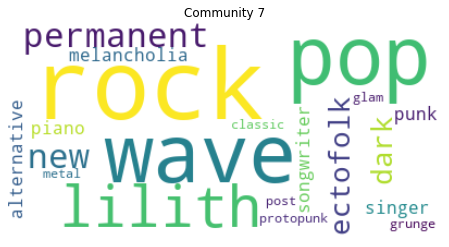

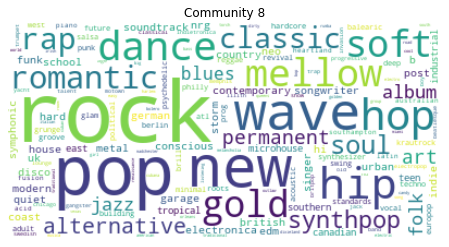

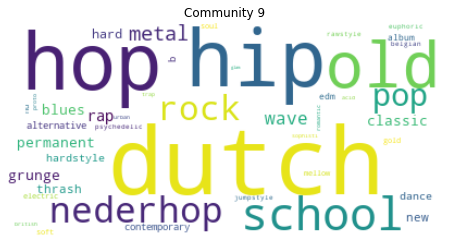

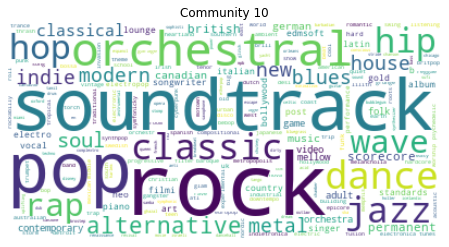

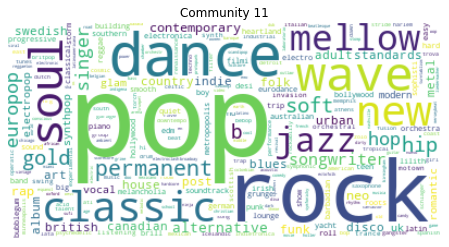

In [ ]:
# Create a WordCloud for each comunity
for (key, tfidf_doc) in TF_gen.items():
    doc_words = " ".join([(w + " ") * int(n) for w, n in Counter(tfidf_doc).most_common()])
    plot_word_cloud(doc_words, "Community " + str(key))

# 6. Text analysis

In order to perform the text analysis the top 5 songs (ranked by track frequency) for each artist have been extracted. We used the Genius API to obtain the lyrics of each track.
After this was done, we dropped tracks that had the following caveats:
*   Tracks that had no lyrics available on Genius API
*   Tracks that were not in English
We also used RegEx to clean up superfluous constructors ([Intro], [Verse], etc) in the lyrics that were insignificant for sentiment analysis and might influence the lyrics words' frequency in a negative way.

Then, we tokenized each song’s lyrics and obtained their sentiment scores using labMT.

The final tracks dataset contained 3137 tracks and 8 columns, which include information on:
* track - key-value pair of (track_name, artist_name)
* lyrics - processed lyrics of each track, obtained from
Genius API
* trackfreq - number of occurrences of the particular track
* trackname - name of the track
* artistname - name of the artist
* genre - list of genres the song belongs to
* tokens - list of individual word tokens from the lyrics
* sentiment - sentiment scores of each song’s lyrics

Information about implementation can be found here [tracks_preprocessing](https://github.com/bakos97/Final-project-Social-Graphs/blob/chris/notebooks/tracks_preprocessing.ipynb)

In [2]:
# load tracks dataset
tracks_df = pd.read_pickle(r'/content/drive/MyDrive/SocialGraphs/Spotify_data/tracks_dataset_lyrics.pickle')
# load spotify dataset
spotify_df = pd.read_pickle(r"/content/drive/MyDrive/SocialGraphs/Spotify_data/spotify_dataset_processed.pickle")

## 6.1 Wordclouds for top 5 genres

In [6]:
print("Number of distinct genres:", len(set([g for genre in tracks_df.genre for g in genre])))

Number of distinct genres: 594


Our research seeks to explore how the lyrics are impacted by differing music genres. As we saw that the Spotify returns a wide range of genres, so there is no suprise that the number of distinct genres is 594. In order to perform our analysis, we will use the most 5 frequrnt genres in our dataset.

In [3]:
# compute the genres frequency
genre_counter = Counter([g for genre in tracks_df.genre for g in genre])
# extract 5 most common genres
genres_5 = genre_counter.most_common(5)
print("Top 5 genres:\n")
for g, _ in genres_5:
    print(g)

Top 5 genres:

dance pop
rock
pop
hip hop
classic rock


In [7]:
# split songs lyrics based on genres
genres_doc = defaultdict(list)

for g, _ in genres_5:
    genres_doc[g] = " ".join(list(tracks_df[list(map(lambda genres:g in genres, tracks_df.genre))].lyrics))

We are interested in finding the words that are specific to each genre. In this case, a simple count of frequency is insufficient. Our approach is based on TF-IDF, because it takes into account the rarity of a word across a set of documents. For this instance, we will consider each genre as being a document, and we will associate the lyrics with the corresponding genre. The first step is to tokenized the lyrics.

In [10]:
def get_tokens(document, stopwords=False, lemmatize=False):
    # 1. and 2. Tokenize the document into individual strings
    # and Remove all punctuation from your list of tokens
    tokens = tokenizer.tokenize(document)
    
    # 3. set evarything to lower case
    tokens = [w.lower() for w in tokens]
    
    if stopwords is True:
        # remove stop words
        tokens = [w for w in tokens if w not in stop_words]
    if lemmatize is True:
        # lemmatize the words
        tokens = [wnl.lemmatize(w) for w in tokens]
    
    return tokens

In [ ]:
document_bag_of_words = dict([(key, get_tokens(value, lemmatize=True)) for key, value in genres_doc.items()])

The next step is to compute the TF-IDF score.

In [ ]:
def computeTF(bag_of_words):
    """
        Get frequency of each word in each document
    """
    return dict([(key, Counter(value)) for key, value in bag_of_words.items()])

def computeIDF(document_words_freq):
    N = len(document_words_freq)
    
    idf_dict = {}
    for document in document_words_freq.values():
        for word, val in document.items():
            if val > 0:
                if word in idf_dict:
                    idf_dict[word] += 1
                else:
                    idf_dict[word] = 1
    
    for word, val in idf_dict.items():
        idf_dict[word] = math.log(N / val)
    return idf_dict

def computeTFIDF(tfs, idfs):
    tfidf = {}
    for word, val in tfs.items():
        tfidf[word] = val * idfs[word]
    return tfidf

In [ ]:
document_tf = computeTF(document_bag_of_words)
word_idf = computeIDF(document_tf)
document_tfidf = dict([(key, computeTFIDF(document_tf[key], word_idf)) for key in genres_doc.keys()])

In [ ]:
# Plot
def plot_word_cloud(document, title):
    wc = WordCloud(
            background_color="white", 
            max_words=4000, contour_width=3, 
            contour_color='steelblue', 
            collocations=False
        ).generate(document)

    plt.figure(figsize=[8,4])
    plt.imshow(wc, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.show()

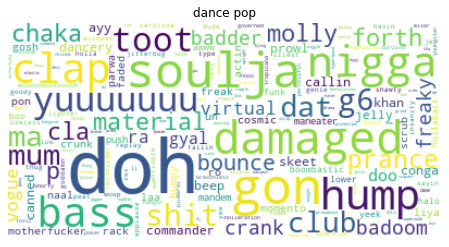

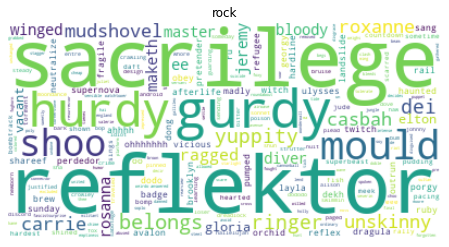

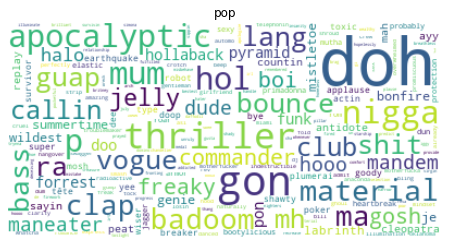

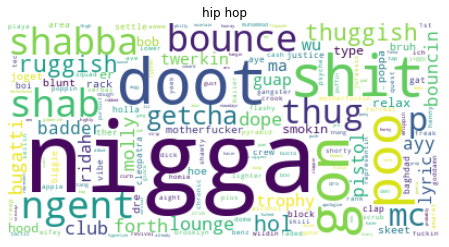

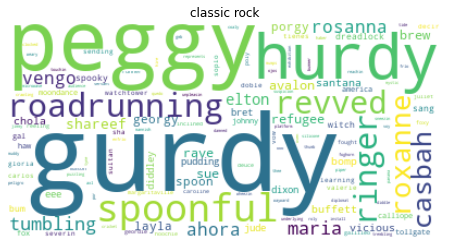

In [ ]:
# Create a WordCloud for each comunity
for (key, tfidf_doc) in document_tfidf.items():
    doc_words = " ".join([(w + " ") * int(n) for w, n in Counter(tfidf_doc).most_common()])
    plot_word_cloud(doc_words, str(key))

In the world cloud corresponding to **Dance Pop**, we noticed a series of interjections such as "yuuuuuu", "doh", and "laa", and the words "bass", "bounce", and "club" are which are related to this genre. 

The **Rock** word cloud does not seem to depict the rock genre. Some of the words correspond to songs titles ("Roxanne", "Sacrilege", "Reflektor") and others might be related to the sounds "shoo", "hurdy", or "gurdy" - the last two words might also be a song title "Hurdy Gurdy" man.

In the case of **Pop**'s word cloud, a significant number of words can also be seen in the **Dance-Pop** word cloud, which emphasises the similarity of these to musical genres. 


**Hip-hop** seems to be the best depicted since it genre is known for using a large number of swearing and jargon words like (thuggish ruggish, used to describe a thug-like nature).

As in the case of rock, the **classic rock** word cloud also contains songs titles ("Layla", "Roxanne"), and we see again the presence of "hurdy", "gurdy" words.


## 6.2 Sentiment Analysis

### 6.2.1 Sentiment by genres

We are interested to see what are the sentiment values for the five most popular genres.

In [12]:
# compute sentiment based on genres
genres_sentiment = defaultdict(list)
for g, _ in genres_5:
    genres_sentiment[g] = np.mean(tracks_df[list(map(lambda genres:g in genres, tracks_df.genre))].sentiment)

In [13]:
print("Sentiment by genre\n")
for g, s in genres_sentiment.items():
    print(g,":",round(s,3))

Sentiment by genre

dance pop : 5.463
rock : 5.44
pop : 5.458
hip hop : 5.422
classic rock : 5.482


The sentiment scores of each genre appear to be similar, and the rarity of words may have contributed to this outcome. As we've seen in the lyrics wordclouds for each genre, the showed words tend to be rare, and they might not be found in the LabMT (which has been used for computing the sentiment for each track). However, the sadness genre seems to be Hip-Hop. It is interesting since we can notice words like "pistol", which have a negative association in its lyrics' wordcloud.


### 6.2.2 Sentiment by artist

Before analyzing and drawing conclusions about the happiest and saddest artists, we will analyze the distribution of sentiments.

In [14]:
# compute the sentiment score for all artists
artists_sentiment = []
for a in set([a for artists in tracks_df.artistname for a in artists]):
    artists_sentiment.append((a, np.mean(tracks_df[list(map(lambda art: a in art, tracks_df.artistname))].sentiment)))

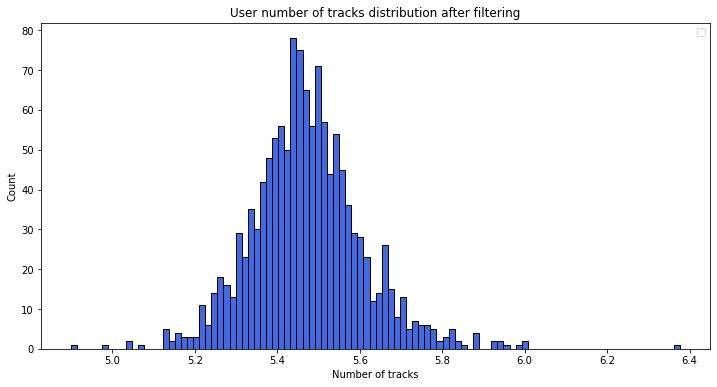

In [20]:
_sentimentval = [s for a, s in artists_sentiment]

# plot histogram
fig, ax = plt.subplots(figsize=(12,6))

plt.title('User number of tracks distribution after filtering')
ax.hist(_sentimentval, bins=100, color='royalblue', edgecolor = "black")
ax.set_xlabel("Number of tracks")
ax.set_ylabel("Count")
plt.legend()
plt.show()

The artists' sentiment distribution follows a normal distribution, where we can notice extreme values at the higher and lower ends of the distribution. We will investigate these artists (the five happier and the five sadder ones) to determine the factors that set them apart from the rest of their peers.

In [15]:
artists_sentiment =  sorted(artists_sentiment, key=lambda t: t[1], reverse=True)

print("The most happiest 5 artist\n")
for a, s in artists_sentiment[:5]:
    print(a,":",round(s,3))

The most happiest 5 artist

gui boratto : 6.377
mase : 6.002
glenn miller : 5.999
k-ci : 5.988
art garfunkel : 5.961


In [ ]:
list(tracks_df[list(map(lambda art: 'gui boratto' in art, tracks_df.artistname))].lyrics)

['What a beautiful life...\nWhat a beautiful world...\nWhat a beautiful life...\nWhat a beautiful world...\n\nWhat a beautiful life...\nWhat a beautiful life...\nWhat a beautiful world...\n\nI can see light...\nI can feel love...\nI can see the sun...\nWhat a beautiful life...\nWhat a beautiful life']

By examining the lyrical content of the most happiesr artist, we observe a high frequency of words such as *beautiful*, *love*, *life*, *light* which possess a strong positive sentiment and a high sentiment value in LabMT dataset.

In [ ]:
artists_sentiment =  sorted(artists_sentiment, key=lambda t: t[1])

print("The most saddest 5 artist\n")
for a, s in artists_sentiment[:5]:
    print(a,":",round(s,3))

The most saddest 5 artist

flosstradamus : 4.9
herbie hancock : 4.976
serj tankian : 5.042
moby : 5.045
dj snake : 5.063


In [ ]:
list(tracks_df[list(map(lambda art: 'flosstradamus' in art, tracks_df.artistname))].lyrics)

['Rollup the grass, rollup rollup the grass\nRollup the grass, rollup rollup the grass\nRollup the grass, rollup rollup the grass\nRollup the grass, rollup rollup the grass\n\n*COUGH* *COUGH*\n\nRollup the grass, rollup rollup the grass\nRollup the grass, rollup rollup the grass\nRollup the grass, rollup rollup the grass\nRollup the grass, rollup rollup the grass\n\n*COUGH* *COUGH*\n\nRollup the grass, rollup rollup the grass\nRollup the grass, rollup rollup the grass\nRollup the grass, rollup rollup the grass\nRollup the grass, rollup rollup the grass\n\n*COUGH* *COUGH*']

Since Flosstradamus is a repressentat of the **trap genre** is lyrics does not necessarly convey a feeling. In this case, the most frequent word is *rollup*, which has 34 occurances, is not relevant for sentiment analysis. Having multiple words without a sentiment load is difficult to perform a sentiment analysis relying on the sentiment association of words. For better results, other methods for lyrics sentiment analysis should be used.